
# EDA Notebook
### Phase III

All analysis is performed on the full training set. In addition, during phase II we noted some surprise findings that we further explore below.

In [0]:

from pyspark.sql import Window
import pyspark.sql.functions as F
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from pyspark.sql.types import FloatType
from pyspark.ml import Pipeline
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.sql.functions import col, count, when, lit
from pyspark.ml.feature import StringIndexer
from pyspark.sql.utils import AnalysisException
from pyspark.sql.types import StringType, DoubleType
from pyspark.ml.stat import Correlation
import networkx as nx
from pyspark.sql.functions import hour
from pyspark.sql.functions import col, avg, floor
from pyspark.sql.functions import count as sql_count, sum as sql_sum

print("Welcome to the W261 final project!") 

Welcome to the W261 final project!



### Load Data

In [0]:

# The following blob storage is accessible to team members only (read and write)
# access key is valid til TTL
# after that you will need to create a new SAS key and authenticate access again via DataBrick command line
blob_container  = "261-prrjckaw-container"       # The name of your container created in https://portal.azure.com
storage_account = "261prrjckaw"  # The name of your Storage account created in https://portal.azure.com
secret_scope    = "261-project-scope"           # The name of the scope created in your local computer using the Databricks CLI
secret_key      = "261-project-key"             # The name of the secret key created in your local computer using the Databricks CLI
team_blob_url   = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"  #points to the root of your team storage bucket


# the 261 course blob storage is mounted here. 
mids261_mount_path      = "/mnt/mids-w261"

# SAS Token: Grant the team limited access to Azure Storage resources
spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)


# see what's in the blob storage root folder 
display(dbutils.fs.ls(f"{team_blob_url}"))

path,name,size,modificationTime
wasbs://261-prrjckaw-container@261prrjckaw.blob.core.windows.net/TP/,TP/,0,1702403305000


In [0]:
#temp 
random_seed = 100

raw_cols = [
    "STATION",
    "DATE",
    "LATITUDE",
    "ELEVATION",
    "LONGITUDE",
    "HourlyAltimeterSetting",
    "HourlyDewPointTemperature",
    "HourlyDryBulbTemperature",
    "HourlyPrecipitation",
    "HourlyPresentWeatherType",
    "HourlyPressureChange",
    "HourlyPressureTendency",
    "HourlyRelativeHumidity",
    "HourlySkyConditions",
    "HourlySeaLevelPressure",
    "HourlyStationPressure",
    "HourlyVisibility",
    "HourlyWetBulbTemperature",
    "HourlyWindDirection",
    "HourlyWindGustSpeed",
    "HourlyWindSpeed",
    #"w_year",
    #"w_month",
    #"w_day",
    "DAY_OF_MONTH",
    "DAY_OF_WEEK",
    "YEAR",
    "FL_DATE",
    "OP_CARRIER",
    #"TAIL_NUM",
    #"OP_CARRIER_FL_NUM",
    "ORIGIN",
    #"ORIGIN_CITY_NAME",
    #"ORIGIN_STATE_NM",
    #"ORIGIN_WAC",
    #"DEST_AIRPORT_ID",
    "DEST",
    #"DEST_CITY_NAME",
    #"DEST_STATE_NM",
    "CRS_ARR_TIME",
    "CRS_DEP_TIME",
    "CRS_ELAPSED_TIME",
    "DISTANCE",
    #"DISTANCE_GROUP",
    "DEP_DEL15",
    #"station_id",
    #"utc_departure",
    #"airport_code",
    #"before_utc_departure",
    #"f_year",
    #"f_month",
    #"f_day",
    #"time_distance",
    #"rank",
    "QUARTER",
    "MONTH",
    "RecentHourlyPrecipitationDelta",
    "RecentHourlyRelativeHumidityDelta",
    "HolidayTravel",
    "ORIGIN_DELAY_SUM",
    "TAIL_NUM_PREV_DELAY",
]


feature_interact_columns = [
    "Precipitation_Carrier",
    "Temperature_Month",
    "WindSpeed_Origin",
    "Visibility_OriginAirport",
    "Precipitation_at_DepTime_and_Origin",
    "Origin_CRS_DEP_TIME",
    "Carrier_DayOfWeek",
    "Month_CRS_DEP_TIME",
    "Carrier_CRS_DEP_TIME",
    "DayOfWeek_CRS_DEP_TIME",
]

weather_interactions = [
    "WindSpeed_Visibility",
    "DewPoint_Humidity",
    "Temp_WindSpeed",
    "PressureTendency_Altimeter",
    "Visibility_SkyConditions",
    "WindDir_GustSpeed",
    "SeaLevel_StationPressure",
    "Precipitation_WetBulbTemp",
    "PressureChange_DewPoint",
    "Humidity_Temperature",
]

float_cols = [
    "DATE",
    "LATITUDE",
    "ELEVATION",
    "LONGITUDE",
    "CRS_ARR_TIME",
    "CRS_DEP_TIME",
    "QUARTER",
    "MONTH",
    "DAY_OF_MONTH",
    "DAY_OF_WEEK",
    "YEAR",
    "FL_DATE",
    "CRS_ELAPSED_TIME",
    "DISTANCE",
    "DEP_DEL15",
    "HourlyAltimeterSetting",
    "HourlyDewPointTemperature",
    "HourlyDryBulbTemperature",
    "HourlyPrecipitation",
    "HourlyPresentWeatherType",
    "HourlyPressureChange",
    "HourlyPressureTendency",
    "HourlyRelativeHumidity",
    "HourlySkyConditions",
    "HourlySeaLevelPressure",
    "HourlyStationPressure",
    "HourlyVisibility",
    "HourlyWetBulbTemperature",
    "HourlyWindDirection",
    "HourlyWindGustSpeed",
    "HourlyWindSpeed",
    #"utc_departure",
    #"before_utc_departure",
    #"time_distance",
    "RecentHourlyPrecipitationDelta",
    "RecentHourlyRelativeHumidityDelta",
    "ORIGIN_DELAY_SUM",
    "TAIL_NUM_PREV_DELAY",
]

cat_cols = [
    "STATION",
    "OP_CARRIER",
    #"TAIL_NUM",
    #"OP_CARRIER_FL_NUM",
    "ORIGIN",
    #"ORIGIN_CITY_NAME",
    #"ORIGIN_STATE_NM",
    #"ORIGIN_WAC",
    #"DEST_AIRPORT_ID",
    "DEST",
    #"DEST_CITY_NAME",
    #"DEST_STATE_NM",
    #"DISTANCE_GROUP",
    #"station_id",
    #"airport_code",
    #"w_year",
    #"w_month",
    #"w_day",
    #"f_year",
    #"f_month",
    #"f_day",
    #"rank",
    "HolidayTravel",
]

float_cols_no_y = [column for column in float_cols if column != "DEP_DEL15"] 
cat_cols_mean = [column + "_mean" for column in cat_cols]

final_cols = (
    cat_cols_mean + float_cols_no_y + weather_interactions + feature_interact_columns
)
df_otpw = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df")\
    .filter((col("YEAR").isin("2015", "2016"))).select(raw_cols)

In [0]:
val_predictions = spark.read.parquet(f"{team_blob_url}/TP/gb_final_predections/")

In [0]:
spark.read.format("csv").option("header","true").load(f"dbfs:/mnt/mids-w261/OTPW_60M/").count()

---------------------------------------------------------------------------
Py4JJavaError                             Traceback (most recent call last)
File <command-1012234209202090>, line 1
----> 1 spark.read.format("csv").option("header","true").load(f"dbfs:/mnt/mids-w261/OTPW_60M/").count()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/readwriter.py:307, in DataFrameReader.load(self, path, format, schema, **options)
    305 self.options(**options)
    306 if isinstance(path, str):
--> 307     return self._df(self._jreader.load(path))
    308 elif path is not None:
    309     if type(path) != list:

File /databricks/sp

In [0]:
display(val_predictions.limit(5))

STATION,DATE,LATITUDE,ELEVATION,LONGITUDE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_CARRIER,ORIGIN,DEST,CRS_ARR_TIME,CRS_DEP_TIME,CRS_ELAPSED_TIME,DISTANCE,DEP_DEL15,RecentHourlyPrecipitationDelta,RecentHourlyRelativeHumidityDelta,HolidayTravel,ORIGIN_DELAY_SUM,TAIL_NUM_PREV_DELAY,AirportSize,STATION_mean,OP_CARRIER_mean,ORIGIN_mean,DEST_mean,HolidayTravel_mean,DayOfWeek_CRS_DEP_TIME,Carrier_CRS_DEP_TIME,Month_CRS_DEP_TIME,Carrier_DayOfWeek,Origin_CRS_DEP_TIME,Precipitation_at_DepTime_and_Origin,Visibility_OriginAirport,WindSpeed_Origin,Temperature_Month,Precipitation_Carrier,WindSpeed_Visibility,DewPoint_Humidity,Temp_WindSpeed,PressureTendency_Altimeter,Visibility_SkyConditions,WindDir_GustSpeed,SeaLevel_StationPressure,Precipitation_WetBulbTemp,PressureChange_DewPoint,Humidity_Temperature,features,scaledFeatures,rawPrediction,probability,prediction,YEAR,QUARTER,MONTH
72572024127,2.01907021E13,40.7781,1287.8,-111.9694,30.06,52.0,67.0,0.0,0.0,0.01,5.0,59.0,74.0,29.9,25.74,10.0,58.0,180.0,29.0,11.0,1.0,1.0,2.01907E7,AA,SLC,CLT,604.0,9.0,235.0,1727.0,0.0,0.0,44.0,0,81.0,81.0,huge,0.4279547,0.4812897,0.4279547,0.43715152,0.49796122,9.0,4.3316073,63.0,0.4812897,3.8515923,0.0,4.279547,4.707502,469.0,0.0,110.0,3068.0,737.0,150.3,740.0,5220.0,769.626,0.0,0.52,3953.0,"Map(vectorType -> dense, length -> 59, values -> List(0.42795470356941223, 0.48128971457481384, 0.42795470356941223, 0.4371515214443207, 0.49796122312545776, 2.0190702075904E13, 40.778099060058594, 1287.800048828125, -111.96939849853516, 604.0, 9.0, 3.0, 7.0, 1.0, 1.0, 2019.0, 2.01907E7, 235.0, 1727.0, 30.059999465942383, 52.0, 67.0, 0.0, 0.0, 0.009999999776482582, 5.0, 59.0, 74.0, 29.899999618530273, 25.739999771118164, 10.0, 58.0, 180.0, 29.0, 11.0, 0.0, 44.0, 81.0, 81.0, 110.0, 3068.0, 737.0, 150.3000030517578, 740.0, 5220.0, 769.6259765625, 0.0, 0.5199999809265137, 3953.0, 0.0, 469.0, 4.7075018882751465, 4.279547214508057, 0.0, 3.8515923023223877, 0.48128971457481384, 63.0, 4.331607341766357, 9.0))","Map(vectorType -> dense, length -> 59, values -> List(-1.241672038341778, -0.3111969761367905, -1.2395417661861896, -1.0482148814893881, -0.33714374507061745, 2.098920268012118, 0.375416973630626, 2.7679427088278525, -0.6502796325044968, -1.8558105181235032, -2.921150505536722, 0.4498746820137162, 0.14132119464851575, -1.6825486413660191, -1.4789596449656508, 2.0979977264429404, 2.0990982924824824, 1.2564729969021675, 1.5157851018035375, 0.21768549189633854, 0.23181532951353423, 0.2165363067905825, -0.13123302068524678, 0.0, 0.13123580429444837, 0.04121704175846113, -0.17015408169299678, 1.7683511820593232, 0.07707419450770997, -2.5124461758614887, 0.3222965789338212, 0.19908667940335317, 0.06692620497760636, 1.1403780474455967, 0.35103895697262283, -0.2471748249201384, 0.2710240414962445, -0.28581263335623713, -0.28581263335623713, 0.44819181028433214, -0.032038811720021085, 0.4213344761013677, 0.04491758565507693, 1.8049308020259573, 0.43047631310295015, -0.9362513860083358, -0.11644885689823417, 0.14726771613308812, 0.08080601958100364, -0.129436133007385, 0.20963639671869708, 0.08379303274665668, -0.39632987377636675, -0.12192660618506662, -2.7036955332229433, -1.4456755656863582, -1.5498602914944917, -2.6918953601911544, -1.5769469114092565))","Map(vectorType -> dense, length -> 2, values -> List(0.3447508069450107, -0.3447508069450107))","Map(vectorType -> dense, length -> 2, values -> List(0.6658560491110624, 0.33414395088893756))",0.0,2019.0,3.0,7.0
70133026616,2.01907021E13,66.8667,9.1,-162.6333,30.21,44.0,58.0,0.0,0.0,-0.01,1.0,60.0,41.0,30.21,30.19,10.0,51.0,210.0,33.0,11.0,1.0,1.0,2.01907E7,AS,OTZ,ANC,1000.0,835.0,85.0,54

In [0]:
# save `blind_5yr_df` for last test after final model is chosen and all tinkering is complete
# blind_5yr_df = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df".filter((col("YEAR") == "2019"))

train_5yr_df = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df")\
    .filter((col("YEAR").isin("2015", "2016", "2017"))|
            ((col("YEAR").isin("2018")) & (col("MONTH").isin("1", "2", "3", "4"))))\
    .na.drop(subset=["DEP_DEL15"]) \
    .select(raw_cols)
train_5yr_df = train_5yr_df.withColumn("DEP_DEL15", col("DEP_DEL15").cast("int"))

test_blind_5yr_df = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df")\
    .filter((col("YEAR").isin("2018")) & (col('MONTH').isin('5','6','7','8','9','10','11','12')))\
    .na.drop(subset=["DEP_DEL15"]) \
    .select(raw_cols)
test_blind_5yr_df = test_blind_5yr_df.withColumn("DEP_DEL15", col("DEP_DEL15").cast("int"))

full_df = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df")

test_5yr_df = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df")\
    .filter((col("YEAR").isin("2019")))\
    .na.drop(subset=["DEP_DEL15"]) \
    .select(raw_cols)

train_4yr_df = spark.read.parquet(f"{team_blob_url}/TP/phase3data/five_year_joined_df")\
    .filter((col("YEAR").isin("2015", "2016", "2017,2018")))\
    .na.drop(subset=["DEP_DEL15"]) \
    .select(raw_cols)

In [0]:
from pyspark.sql.functions import col
from pyspark.sql.types import FloatType

check='CRS_ELAPSED_TIME'

# Ensure your DataFrame is named train_5yr_df
# Convert DEP_DEL15 and ORIGIN_DELAY_sum to float
train_5yr_df = train_5yr_df.withColumn("DEP_DEL15", col("DEP_DEL15").cast(FloatType()))
train_5yr_df = train_5yr_df.withColumn(check, col(check).cast(FloatType()))

# Calculate the correlation
correlation = train_5yr_df.stat.corr("DEP_DEL15", check)

print(f"Correlation between DEP_DEL15 and ORIGIN_DELAY_SUM: {correlation}")


Correlation between DEP_DEL15 and ORIGIN_DELAY_SUM: 0.028133457757456386


In [0]:
from pyspark.sql.functions import min, max

# Find the first (earliest) date
first_date = df_otpw.select(min("DATE")).first()[0]

# Find the last (latest) date
last_date = df_otpw.select(max("DATE")).first()[0]

# Print the results
print(f"The earliest date in the dataset is: {first_date}")
print(f"The latest date in the dataset is: {last_date}")

The earliest date in the dataset is: 2015-01-01T04:53:00
The latest date in the dataset is: 2017-01-01T07:54:00


In [0]:
phase_b_features = ['CARRIERVec',
 'ORIGINVec',
 'ORIGIN_STATE_NMVec',
 'ORIGIN_WACVec',
 'DESTVec',
 'DEST_STATE_NMVec',
 'STATIONVec',
 'ELEVATIONVec',
 'NAMEVec',
 'REPORT_TYPEVec',
 'SOURCEVec',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'CRS_ARR_TIME',
 'CRS_DEP_TIME',
 'LATITUDE',
 'LONGITUDE',
 'HourlyAltimeterSetting',
 'HourlyDewPointTemperature',
 'HourlyDryBulbTemperature',
 'HourlyPrecipitation',
 'HourlyPressureChange',
 'HourlyPressureTendency',
 'HourlyRelativeHumidity',
 'HourlySeaLevelPressure',
 'HourlyStationPressure',
 'HourlyVisibility',
 'HourlyWetBulbTemperature',
 'HourlyWindDirection',
 'HourlyWindGustSpeed',
 'HourlyWindSpeed',
 'HourlySkyConditions',
 'DEP_DEL15']


### Prep Data

In [0]:
#STEP 2
### Dictionary of Features to Use ###
dict_flight_cols = {
'time_period' : ['QUARTER', ### one hot encode Quarter?
 'MONTH', # one-hot-encode also? large airport category
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'YEAR'],\
   'airline' : [
 'OP_CARRIER', 
 'TAIL_NUM'] #can use to feature engineer but not as feature 
,'origin' : ['ORIGIN',\
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC'],\
  'destination' : [\
  'DEST_AIRPORT_ID',
 'DEST','origin_type',
 'DEST_CITY_NAME',
 'DEST_STATE_NM'],\
'flight_times':\
['CRS_ARR_TIME','CRS_DEP_TIME'],\
'output': ['DEP_DEL15','ARR_DEL15','DEP_DELAY']}

dict_weather_cols = {'categorical':\
['STATION'],
'metrics': ['LATITUDE','ELEVATION', 'LONGITUDE','HourlyAltimeterSetting', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature','HourlyPrecipitation', 'HourlyPresentWeatherType', 'HourlyPressureChange', 'HourlyPressureTendency', \
'HourlyRelativeHumidity', 'HourlySkyConditions', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility',\
  'HourlyWetBulbTemperature', 'HourlyWindDirection', 'HourlyWindGustSpeed', 'HourlyWindSpeed']}
#'STATION', 'DATE', 'ELEVATION', 'NAME', 'REPORT_TYPE', 'SOURCE']



In [0]:
#STEP 3

# create list of column names that are categorical and those that are float
float_cols=[]
float_cols_no_y=[]
cat_cols = []
for key, values in dict_flight_cols.items():
  if (key == 'flight_times') | (key == 'output'):
    float_cols=float_cols+values
  else:
    cat_cols=cat_cols+values

for key, values in dict_weather_cols.items():
  if key == 'metrics':
    float_cols=float_cols+values
  else:
    cat_cols=cat_cols+values

for column in float_cols:
  if column not in ['DEP_DEL15','ARR_DEL15']:
    float_cols_no_y.append(column)

cat_cols_mean = [column+'_mean' for column in cat_cols]

feature_interact_columns = ["Precipitation_Carrier","Temperature_Month","WindSpeed_Origin","Visibility_OriginAirport",\
                      'Precipitation_at_DepTime_and_Origin', "Origin_CRS_DEP_TIME", "Carrier_DayOfWeek","Month_CRS_DEP_TIME","Carrier_CRS_DEP_TIME","DayOfWeek_CRS_DEP_TIME"]

weather_interactions = ["WindSpeed_Visibility","DewPoint_Humidity", "Temp_WindSpeed","PressureTendency_Altimeter","Visibility_SkyConditions","WindDir_GustSpeed","SeaLevel_StationPressure", "Precipitation_WetBulbTemp", "PressureChange_DewPoint","Humidity_Temperature"]



In [0]:
#Mean encode training data and apply to validatioon
def mean_encoding(train_df, val_df, cat_cols):
    mappers = {}

    # Convert DEP_DEL15 to float
    train_df = train_df.withColumn("DEP_DEL15", col("DEP_DEL15").cast("float"))

    for colm in cat_cols:
        # Create the mapper using training data
        mapper = train_df.groupBy(colm).agg(F.mean("DEP_DEL15").alias('mean')).collect()
        mappers[colm] = {row[colm]: row['mean'] for row in mapper}

        # Broadcast the mapper
        broadcasted_mapper = spark.sparkContext.broadcast(mappers[colm])

        # Map function
        map_udf = F.udf(lambda category: broadcasted_mapper.value.get(category, 0), FloatType())

        # Apply mapper to both training and validation data
        train_df = train_df.withColumn(colm + '_mean', map_udf(F.col(colm)))
        val_df = val_df.withColumn(colm + '_mean', map_udf(F.col(colm)))

    return train_df, val_df, mappers


In [0]:
#STEP 5
# cast columns
def cast_columns(df,float_cols,cat_cols,cat_cols_mean,float_cols_no_y):
    
    # Iterate over each column and replace 'T' with 0.001 for columns containing 'Hourly'
    for col_name in df.columns:
        if 'Hourly' in col_name:
            df = df.withColumn(col_name, F.when(F.col(col_name) == 'T', 0.001).otherwise(F.col(col_name)))

    # Fill null values in numerical columns with 0
    for c in float_cols:
        if c == 'DEP_DEL15':    # !!!add if statement if it is also cancelled
            df = df.na.fill({c: 1.0})
        else:
            df = df.na.fill({c: 0.0}) # !!!feed forward data instead of imputing 0

    # Cast the label column 'DEP_DEL15' to a numeric type (integer or float)
    df = df.withColumn('DEP_DEL15', col('DEP_DEL15').cast('float'))

    # Cast float columns to float type
    for float_col in float_cols_no_y:
        df = df.withColumn(float_col, col(float_col).cast('float'))

    new_columns = cat_cols_mean+float_cols
    for c in new_columns:
        if c == 'DEP_DEL15':
            df = df.na.fill({c: 1.0}) #!!!
        else:
            df = df.na.fill({c: 0.0}) #111

    df=df.dropna() #clean just in case
    
    return df


In [0]:
#STEP 6 (Optional)
# create interactions
def create_interactions(df):
  #Day of Week and Departure Time
  df = df.withColumn("DayOfWeek_CRS_DEP_TIME", col("DAY_OF_WEEK_mean") * col("CRS_DEP_TIME"))

  #Carrier and Departure Time
  df = df.withColumn("Carrier_CRS_DEP_TIME", col("OP_CARRIER_mean") * col("CRS_DEP_TIME"))

  #Month and Departure Time
  df = df.withColumn("Month_CRS_DEP_TIME", col("MONTH_mean") * col("CRS_DEP_TIME"))

  #Carrier and Day of Week
  df = df.withColumn("Carrier_DayOfWeek", col("OP_CARRIER_mean") * col("DAY_OF_WEEK_mean"))

  #Origin Airport and Departure Time
  df = df.withColumn("Origin_CRS_DEP_TIME", col("ORIGIN_mean") * col("CRS_DEP_TIME"))

  #Weather Conditions and Time of Day
  df = df.withColumn("Precipitation_at_DepTime_and_Origin", col("HourlyPrecipitation") * col("CRS_DEP_TIME")*col("ORIGIN_mean"))

  #Visibility and Airport Traffic
  df = df.withColumn("Visibility_OriginAirport", col("HourlyVisibility") * col("ORIGIN_mean"))

  #Wind Speed and Origin
  df = df.withColumn("WindSpeed_Origin", col("HourlyWindSpeed") * col("ORIGIN_mean"))

  #Temperature and Time of Year
  df = df.withColumn("Temperature_Month", col("HourlyDryBulbTemperature") * col("MONTH_mean"))

  #Precipitation and Carrier Efficiency
  df = df.withColumn("Precipitation_Carrier", col("HourlyPrecipitation") * col("OP_CARRIER_mean"))

  # Weather Interactions:

  # Wind Speed and Visibility interaction
  df = df.withColumn("WindSpeed_Visibility", col("HourlyWindSpeed") * col("HourlyVisibility"))

  # Dew Point and Humidity Interaction
  df = df.withColumn("DewPoint_Humidity", col("HourlyDewPointTemperature") * col("HourlyRelativeHumidity"))

  # Temperature and Wind Speed Interaction
  df = df.withColumn("Temp_WindSpeed", col("HourlyDryBulbTemperature") * col("HourlyWindSpeed"))

  # Pressure Tendency and Altimeter Setting Interaction
  df = df.withColumn("PressureTendency_Altimeter", col("HourlyPressureTendency") * col("HourlyAltimeterSetting"))

  # Visibility and Sky Conditions Interaction:
  df = df.withColumn("Visibility_SkyConditions", col("HourlyVisibility") * col("HourlySkyConditions"))

  #Wind Direction and Wind Gust Speed Interaction:
  df = df.withColumn("WindDir_GustSpeed", col("HourlyWindDirection") * col("HourlyWindGustSpeed"))

  #Sea Level Pressure and Station Pressure Interaction
  df = df.withColumn("SeaLevel_StationPressure", col("HourlySeaLevelPressure") * col("HourlyStationPressure"))

  #Precipitation and Wet Bulb Temperature Interactio
  df = df.withColumn("Precipitation_WetBulbTemp", col("HourlyPrecipitation") * col("HourlyWetBulbTemperature"))

  #Pressure Change and Dew Point Interaction
  df = df.withColumn("PressureChange_DewPoint", col("HourlyPressureChange") * col("HourlyDewPointTemperature"))

  #Humidity and Temperature Interaction
  df = df.withColumn("Humidity_Temperature", col("HourlyRelativeHumidity") * col("HourlyDryBulbTemperature"))

  feature_interact_columns = ["Precipitation_Carrier","Temperature_Month","WindSpeed_Origin","Visibility_OriginAirport",\
                      'Precipitation_at_DepTime_and_Origin', "Origin_CRS_DEP_TIME", "Carrier_DayOfWeek","Month_CRS_DEP_TIME","Carrier_CRS_DEP_TIME","DayOfWeek_CRS_DEP_TIME"]

  return df,feature_interact_columns


In [0]:
columns = cat_cols+float_cols
df_new = df_otpw.select(*columns)
df_new,df_new,x = mean_encoding(df_new, df_new, cat_cols)
df_new = cast_columns(df_new,float_cols,cat_cols,cat_cols_mean,float_cols_no_y)
df_new, x = create_interactions(df_new)

# Phase III EDA

In [0]:
# get a quick overview of 5-year dataset

num_rows = full_df.count()
num_columns = len(full_df.columns)

print(f"Dataset Overview: Full Dataset\n")
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}\n")

num_rows = test_blind_5yr_df.count()
num_columns = len(test_blind_5yr_df.columns)

print(f"Dataset Overview: Blind Validation\n")
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}\n")

num_rows = test_5yr_df.count()
num_columns = len(test_5yr_df.columns)

print(f"Dataset Overview: Test Dataset\n")
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}\n")

Dataset Overview: Full Dataset

Number of Rows: 21322243
Number of Columns: 62

Dataset Overview: Blind Validation

Number of Rows: 3264384
Number of Columns: 40

Dataset Overview: Test Dataset

Number of Rows: 4902154
Number of Columns: 40



In [0]:
# DOWNSAMPLING
random_seed = 100

def downsample_majority_class(df, label_col, majority_label, minority_label, order_by_cols, random_seed):
    # count number of instances in each class
    major_df = df.filter(col(label_col) == majority_label)
    minor_df = df.filter(col(label_col) == minority_label)
    ratio = major_df.count() / minor_df.count()
    sampled_majority_df = major_df.sample(False, 1.0 / ratio, seed=random_seed)

    sampled_df = sampled_majority_df.unionAll(minor_df)
    return sampled_df.orderBy(order_by_cols)

num_rows = train_4yr_df.count()
num_columns = len(train_4yr_df.columns)

print(f"Dataset Overview: 4-Year Training Dataset\n")
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}\n")

order_by_cols = ["DATE", "CRS_DEP_TIME"]
train = downsample_majority_class(train_4yr_df, "DEP_DEL15", 0, 1, order_by_cols, random_seed)

num_rows = train.count()
num_columns = len(train.columns)

print(f"Dataset Overview: 4-Year Balanced Dataset\n")
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}\n")

# Group by the column and count the occurrences of each value
value_counts = train.groupBy("DEP_DEL15").count()

# Show the result
value_counts.show()

Dataset Overview: 4-Year Training Dataset

Number of Rows: 7588619
Number of Columns: 40

Dataset Overview: 4-Year Balanced Dataset

Number of Rows: 2636831
Number of Columns: 40

+---------+-------+
|DEP_DEL15|  count|
+---------+-------+
|      0.0|1318651|
|      1.0|1318180|
+---------+-------+



In [0]:
# DOWNSAMPLING
random_seed = 100

def downsample_majority_class(df, label_col, majority_label, minority_label, order_by_cols, random_seed):
    # count number of instances in each class
    major_df = df.filter(col(label_col) == majority_label)
    minor_df = df.filter(col(label_col) == minority_label)
    ratio = major_df.count() / minor_df.count()
    sampled_majority_df = major_df.sample(False, 1.0 / ratio, seed=random_seed)

    sampled_df = sampled_majority_df.unionAll(minor_df)
    return sampled_df.orderBy(order_by_cols)

#### missing data

In [0]:
# total number of rows
total_rows = df_otpw.count()

# create dataframe with percentage of nulls for each column
null_percentage = df_otpw.select([(count(when(col(c).isNull(), c)) / total_rows).alias(c) for c in df_otpw.columns])

# transpose dataframe
null_percentage_transposed = null_percentage.selectExpr("stack(" + str(len(df_otpw.columns)) + "," + ",".join(["'" + c + "', " + c for c in df_otpw.columns]) + ") as (Column, NullPercentage)")

# filter out columns with 0% nulls
null_percentage_non_zero = null_percentage_transposed.filter("NullPercentage > 0")

# show results
null_percentage_non_zero.show(null_percentage_non_zero.count(), truncate=False)


+--------------------------------------------+---------------------+
|Column                                      |NullPercentage       |
+--------------------------------------------+---------------------+
|TAIL_NUM                                    |0.0023861553329665715|
|DEP_TIME                                    |0.01431460897700927  |
|DEP_DELAY                                   |0.01443153435678058  |
|DEP_DELAY_NEW                               |0.01443153435678058  |
|DEP_DEL15                                   |0.01443153435678058  |
|DEP_DELAY_GROUP                             |0.01443153435678058  |
|TAXI_OUT                                    |0.014705341073913927 |
|WHEELS_OFF                                  |0.014705082960492798 |
|WHEELS_ON                                   |0.015214856967222022 |
|TAXI_IN                                     |0.015214856967222022 |
|ARR_TIME                                    |0.015214856967222022 |
|ARR_DELAY                        

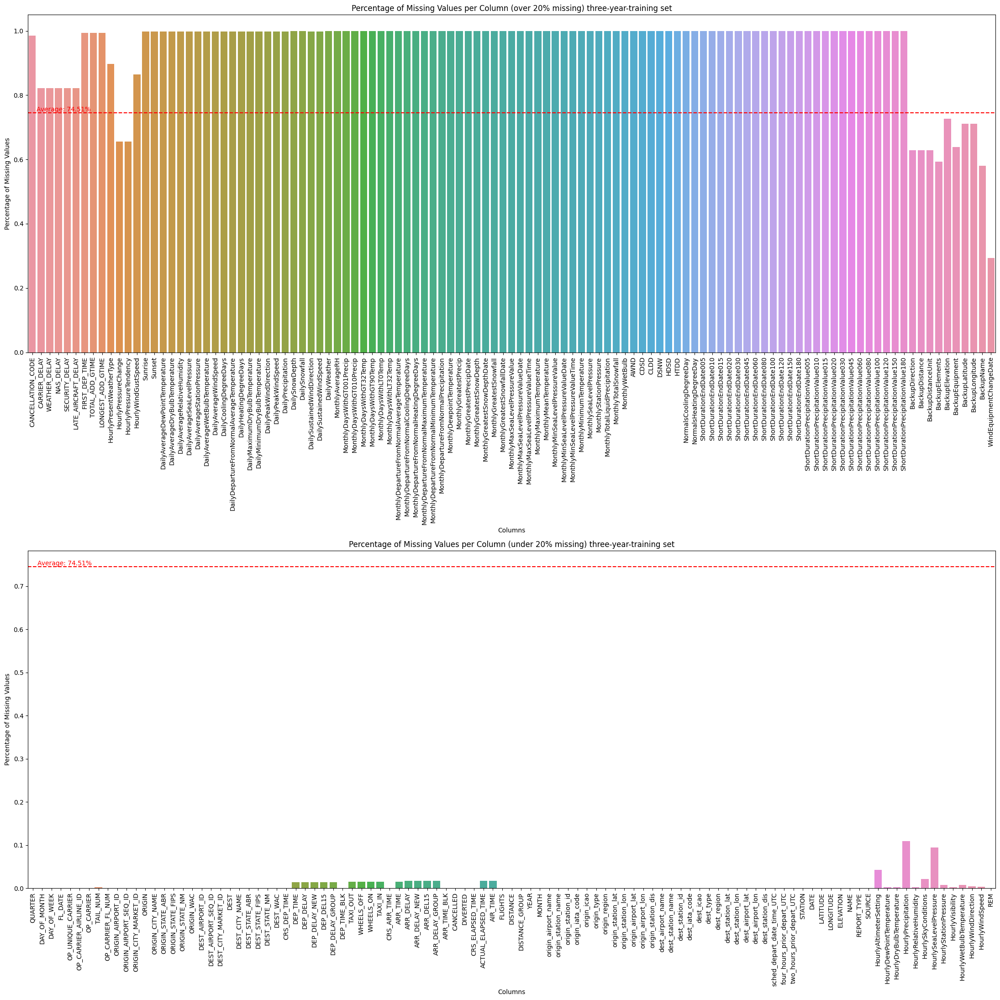

In [0]:
# convert to Pandas for graphing

null_percentage_pd_whole = null_percentage_non_zero.toPandas()
null_percentage_pd = null_percentage_transposed.filter("NullPercentage >= .2").toPandas()
null_percentage_pd_under = null_percentage_transposed.filter("NullPercentage < .2").toPandas()

# calculate average percentage of missing values
average_missing = null_percentage_pd_whole['NullPercentage'].mean()

# set up figure
plt.figure(figsize=(22, 22))

# first subplot for missing values over 20%
plt.subplot(2, 1, 1)  # (rows, columns, panel number)
sns.barplot(x='Column', y='NullPercentage', data=null_percentage_pd)
plt.xticks(rotation=90)
plt.ylabel('Percentage of Missing Values')
plt.xlabel('Columns')
plt.title('Percentage of Missing Values per Column (over 20% missing) three-year-training set')
plt.axhline(y=average_missing, color='r', linestyle='--')
plt.text(0.5, average_missing, f'Average: {average_missing:.2%}', color='r', va='bottom')

# second subplot for missing values under 20%
plt.subplot(2, 1, 2)  # (rows, columns, panel number)
sns.barplot(x='Column', y='NullPercentage', data=null_percentage_pd_under)
plt.xticks(rotation=90)
plt.ylabel('Percentage of Missing Values')
plt.xlabel('Columns')
plt.title('Percentage of Missing Values per Column (under 20% missing) three-year-training set')
plt.axhline(y=average_missing, color='r', linestyle='--')
plt.text(0.5, average_missing, f'Average: {average_missing:.2%}', color='r', va='bottom')

# show plot
plt.tight_layout()
plt.show()


In [0]:
### Remove rows with over 80% missing data ###
columns_to_keep = null_percentage_transposed.filter(col("NullPercentage") <= 0.8).select("Column").rdd.flatMap(lambda x: x).collect()

# select these columns from df_otpw
df_otpw_filtered = df_otpw.select(*columns_to_keep)

In [0]:
#check redundancy
check_columns = ['QUARTER',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID',
 'ORIGIN',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID',
 'DEST',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'DEST_STATE_FIPS',
 'DEST_STATE_NM',
 'DEST_WAC',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'TAXI_OUT',
 'WHEELS_OFF',
 'WHEELS_ON',
 'TAXI_IN',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'DIVERTED',
 'YEAR',
 'MONTH',
 'origin_airport_name',
 'origin_station_name',
 'origin_station_id',
 'origin_iata_code',
 'origin_icao',
 'origin_type',
 'origin_region',
 'origin_station_lat',
 'origin_station_lon',
 'origin_airport_lat',
 'origin_airport_lon',
 'origin_station_dis',
 'dest_airport_name',
 'dest_station_name',
 'dest_station_id',
 'dest_iata_code',
 'dest_icao',
 'dest_type',
 'dest_region',
 'dest_station_lat',
 'dest_station_lon',
 'dest_airport_lat',
 'dest_airport_lon',
 'dest_station_dis',
 'sched_depart_date_time_UTC',
 'four_hours_prior_depart_UTC',
 'two_hours_prior_depart_UTC',
 'STATION']

#### Correlation and Identify Redundant Data

In [0]:
# function to identify redundant columns

def convert_to_float_and_index(df):
    float_cols = []
    indexed_cols = []
    new_column_names = []

    for column in df.columns:
        # check column type
        if isinstance(df.schema[column].dataType, StringType):
            try:
                print(f'Indexing column: {column}')
                temp_indexer = StringIndexer(inputCol=column, outputCol=column + '_index', handleInvalid='keep').fit(df)
                df = temp_indexer.transform(df)
                indexed_cols.append(column + '_index')
            except AnalysisException as e:
                print(f'Could not index {column}: {e.desc}')
        else:
            # convert to float
            df = df.withColumn(column, col(column).cast(DoubleType()))
            float_cols.append(column)

    new_column_names = indexed_cols + float_cols
    return df.select(*new_column_names), float_cols

# apply function
fraction = 0.1  # Adjust this fraction as needed
df_temp_index, float_cols = convert_to_float_and_index(df_otpw_filtered.sample(False, fraction).select(*check_columns))

sampled_df = df_temp_index


Indexing column: QUARTER
Indexing column: DAY_OF_MONTH
Indexing column: DAY_OF_WEEK
Indexing column: OP_UNIQUE_CARRIER
Indexing column: OP_CARRIER_AIRLINE_ID
Indexing column: OP_CARRIER
Indexing column: OP_CARRIER_FL_NUM
Indexing column: ORIGIN_AIRPORT_ID
Indexing column: ORIGIN_AIRPORT_SEQ_ID
Indexing column: ORIGIN_CITY_MARKET_ID
Indexing column: ORIGIN
Indexing column: ORIGIN_CITY_NAME
Indexing column: ORIGIN_STATE_ABR
Indexing column: ORIGIN_STATE_FIPS
Indexing column: ORIGIN_STATE_NM
Indexing column: ORIGIN_WAC
Indexing column: DEST_AIRPORT_ID
Indexing column: DEST_AIRPORT_SEQ_ID
Indexing column: DEST_CITY_MARKET_ID
Indexing column: DEST
Indexing column: DEST_CITY_NAME
Indexing column: DEST_STATE_ABR
Indexing column: DEST_STATE_FIPS
Indexing column: DEST_STATE_NM
Indexing column: DEST_WAC
Indexing column: CRS_DEP_TIME
Indexing column: DEP_TIME
Indexing column: DEP_DELAY
Indexing column: DEP_DELAY_NEW
Indexing column: DEP_DEL15
Indexing column: DEP_DELAY_GROUP
Indexing column: DEP_

In [0]:
# set up matrix correlation

for c in sampled_df.columns:
    sampled_df = sampled_df.na.fill({c: 0})


# convert to vector column first
assembler = VectorAssembler(inputCols=sampled_df.columns, outputCol="features")
df_vector = assembler.transform(sampled_df).select("features")

# get correlation matrix
matrix = Correlation.corr(df_vector, "features").collect()[0][0]
correlation_matrix = matrix.toArray().tolist()


In [0]:
# convert to numpy
corr_array = np.array(correlation_matrix)

# mask to find locations with correlation > 0.99 and not on the diagonal
mask = (np.abs(corr_array) > 0.999) & (~np.eye(corr_array.shape[0], dtype=bool))

# filter based on mask
filtered_indices = np.unique(np.where(mask)[0])
filtered_corr_array = corr_array[np.ix_(filtered_indices, filtered_indices)]
filtered_columns = [sampled_df.columns[i] for i in filtered_indices]


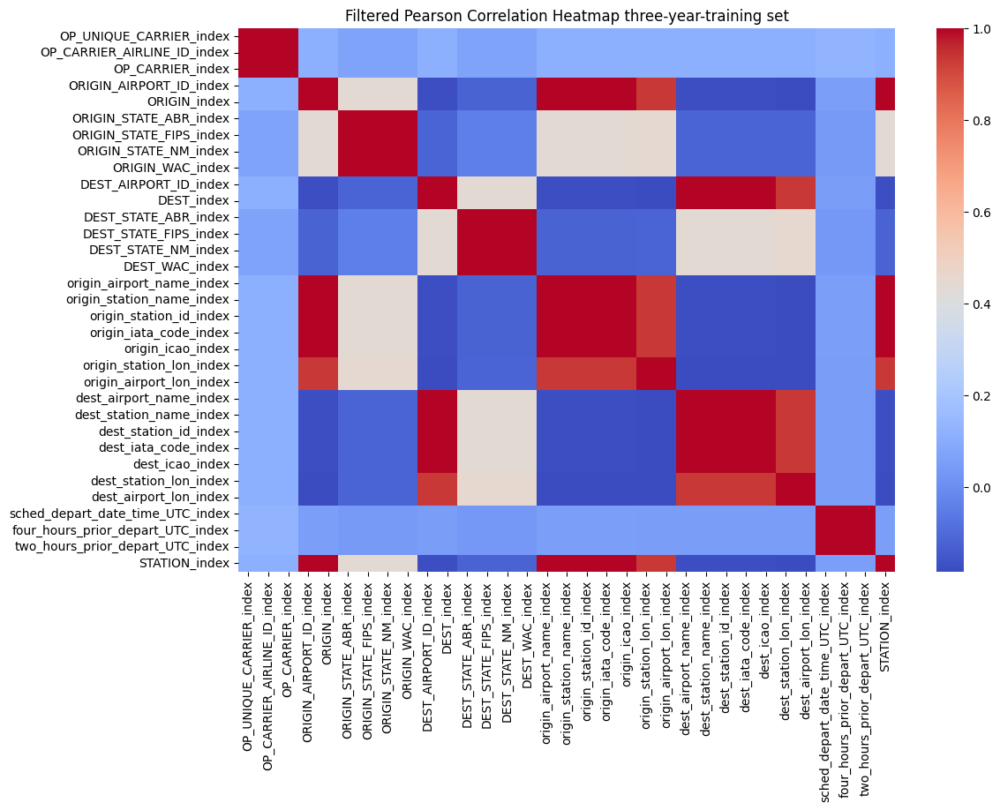

In [0]:
# Graph
filtered_corr_df = pd.DataFrame(filtered_corr_array, index=filtered_columns, columns=filtered_columns)

# draw heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(filtered_corr_df, annot=False, cmap='coolwarm')
plt.title('Filtered Pearson Correlation Heatmap three-year-training set')
plt.show()


# EDA on dependent vairable

In [0]:
df_otpw.columns

Delay Counts with Percentages:
          Delay Reason       Count  Percentage
0        WEATHER_DELAY   9621758.0    5.009091
1        CARRIER_DELAY  66233650.0   34.481263
2            NAS_DELAY  33151288.0   17.258573
3       SECURITY_DELAY    273080.0    0.142166
4  LATE_AIRCRAFT_DELAY  82806141.0   43.108908


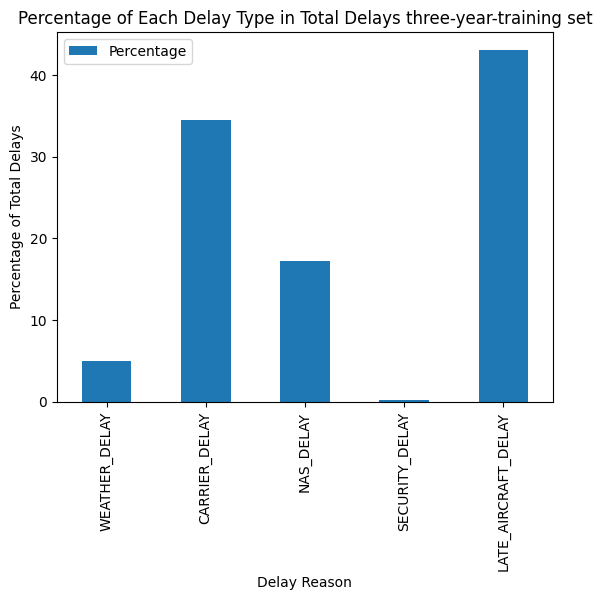

In [0]:
from pyspark.sql.functions import col, sum as sum_

# Filter out rows with null DEP_DEL15 and consider only delayed flights
# Delay reasons
delay_columns = ['WEATHER_DELAY', 'CARRIER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']

df_filtered = df_otpw.filter(df_otpw['DEP_DEL15'] == 1).na.drop(subset=['DEP_DEL15'])

# Convert columns to float and handle nulls
for column in delay_columns:
    df_filtered = df_filtered.withColumn(column, col(column).cast("float"))

# Count each type of delay
delay_counts = df_filtered.select(*delay_columns).agg(*[sum_(col(c)).alias(c) for c in delay_columns])

# Convert to pandas for easier manipulation
delay_counts_pd = delay_counts.toPandas().transpose()
delay_counts_pd.columns = ['Count']
delay_counts_pd = delay_counts_pd.reset_index()
delay_counts_pd.rename(columns={'index': 'Delay Reason'}, inplace=True)

# Calculate total delays
total_delays = delay_counts_pd['Count'].sum()

# Calculate percentages
delay_counts_pd['Percentage'] = (delay_counts_pd['Count'] / total_delays) * 100

print("Delay Counts with Percentages:")
print(delay_counts_pd)

# Plot
delay_counts_pd.plot(kind='bar', x='Delay Reason', y='Percentage')
plt.title('Percentage of Each Delay Type in Total Delays three-year-training set')
plt.xlabel('Delay Reason')
plt.ylabel('Percentage of Total Delays')
plt.show()


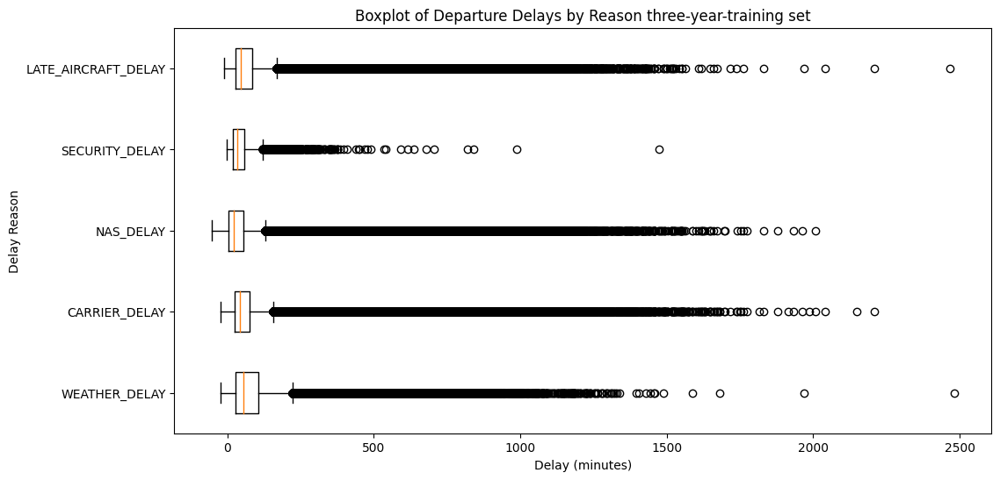

In [0]:
# boxplots for reasons of delay
df = df_otpw.withColumn("DEP_DELAY", col("DEP_DELAY").cast("double"))

# Delay reasons
delay_columns = ['WEATHER_DELAY', 'CARRIER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']

# Prepare data for box plots
delay_data = []
for reason in delay_columns:
    # Filter to include only non-zero delays for the current reason
    filtered_data = df.filter(col(reason) > 0).select("DEP_DELAY").dropna()
    delay_values = [row['DEP_DELAY'] for row in filtered_data.collect()]
    delay_data.append(delay_values)

# Plotting
plt.figure(figsize=(12, 6))

# Create a box plot for each delay reason
plt.boxplot(delay_data, labels=delay_columns, vert=False)
plt.title('Boxplot of Departure Delays by Reason three-year-training set')
plt.xlabel('Delay (minutes)')
plt.ylabel('Delay Reason')
plt.show()


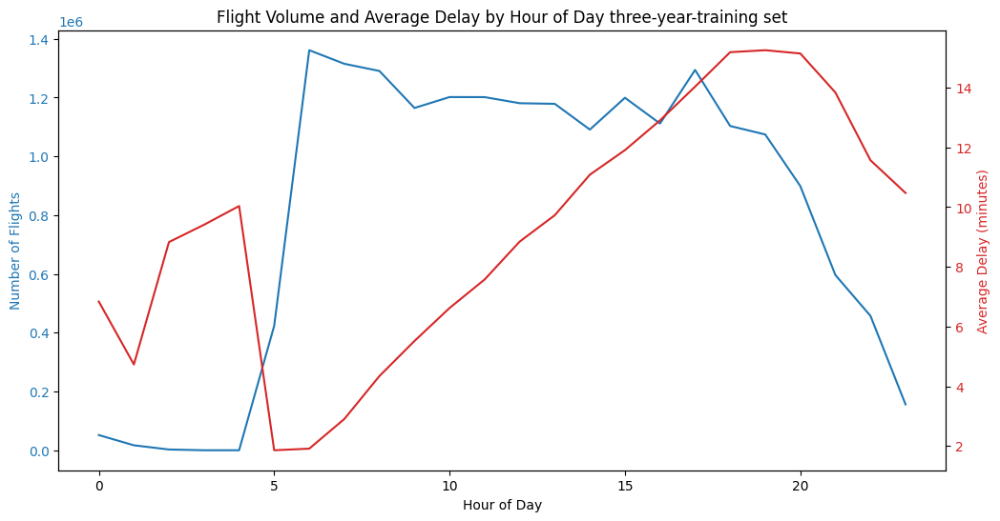

In [0]:
# convert CRS_DEP_TIME to hour
df_otpw = df_otpw.withColumn("Hour", (col("CRS_DEP_TIME") / 100).cast("integer"))

# aggregate flight volume by hour
flight_volume_by_hour = df_otpw.groupBy("Hour").count()

# aggregate average delay by hour
average_delay_by_hour = df_otpw.groupBy("Hour").agg(avg("DEP_DELAY").alias("AverageDelay"))

# join two datasets
combined_data = flight_volume_by_hour.join(average_delay_by_hour, "Hour")
combined_data_pd = combined_data.toPandas()
combined_data_pd.sort_values(by='Hour', inplace=True)

# plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# plot number of flights
ax1.set_xlabel('Hour of Day')
ax1.set_ylabel('Number of Flights', color='tab:blue')
ax1.plot(combined_data_pd['Hour'], combined_data_pd['count'], color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a second y-axis for average delay
ax2 = ax1.twinx()  
ax2.set_ylabel('Average Delay (minutes)', color='tab:red')  
ax2.plot(combined_data_pd['Hour'], combined_data_pd['AverageDelay'], color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

# show
plt.title('Flight Volume and Average Delay by Hour of Day three-year-training set')
plt.show()


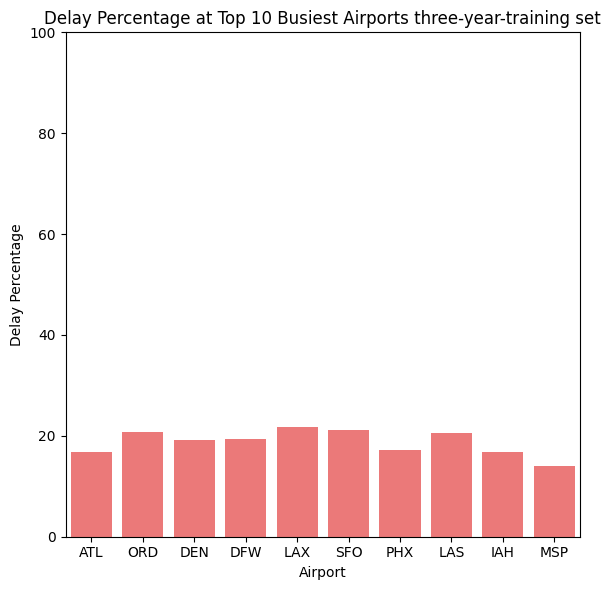

In [0]:


# aggregate total flights and delayed flights for each airport
airport_delays = df_otpw.groupBy('ORIGIN') \
    .agg(sql_count('*').alias('TotalFlights'), 
         sql_sum(col('DEP_DEL15')).alias('DelayedFlights'))
# calculate delay percentage
airport_delays = airport_delays.withColumn('DelayPercentage', 
                                           (col('DelayedFlights') / col('TotalFlights')) * 100)
# find top 10 busiest airports
top_airports = airport_delays.orderBy('TotalFlights', ascending=False).limit(10)
# convert to Pandas DataFrame for plotting
top_airports_pd = top_airports.toPandas()


# Find top 10 busiest airports in terms of total flights
top_airports = airport_delays.orderBy('TotalFlights', ascending=False).limit(10)
# Convert to Pandas DataFrame for plotting
top_airports_pd = top_airports.toPandas()

# Create the figure and a bar plot for delay percentage
plt.figure(figsize=(6, 6))  # Adjusted figure size for better fit

# Plot delay percentage
sns.barplot(x='ORIGIN', y='DelayPercentage', data=top_airports_pd, color='r', alpha=0.6)
plt.ylim(0, 100)  # Set y-axis limit to 100%
plt.xlabel('Airport')
plt.ylabel('Delay Percentage')
plt.title('Delay Percentage at Top 10 Busiest Airports three-year-training set')
plt.tight_layout()  
plt.show()




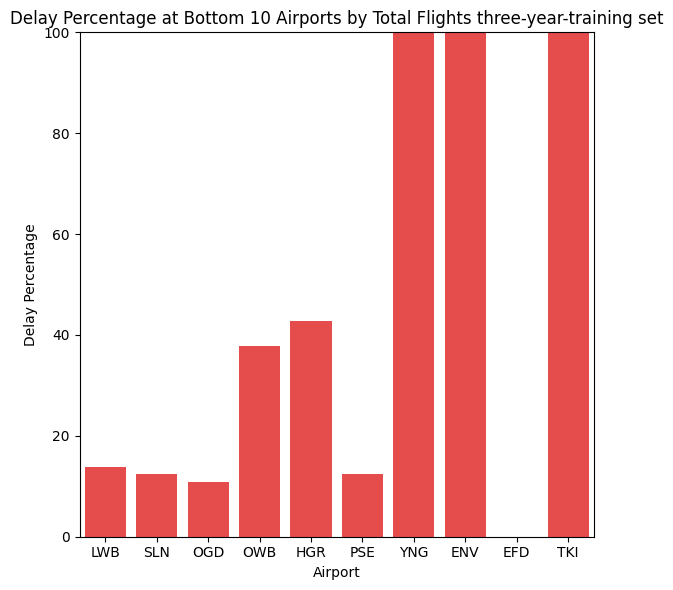

In [0]:
# Find bottom 10 airports in terms of total flights
bottom_airports = airport_delays.orderBy('TotalFlights', ascending=True).limit(10)
# Convert to Pandas DataFrame for plotting
bottom_airports_pd = bottom_airports.toPandas()

# Sort the DataFrame in descending order of TotalFlights for plotting
bottom_airports_pd = bottom_airports_pd.sort_values(by='TotalFlights', ascending=False)

# Create the figure and a bar plot for delay percentage
plt.figure(figsize=(6, 6))  # Adjusted figure size for better fit

# Plot delay percentage
sns.barplot(x='ORIGIN', y='DelayPercentage', data=bottom_airports_pd, color='r', alpha=0.8)
plt.ylim(0, 100)  # Set y-axis limit to 100%
plt.xlabel('Airport')
plt.ylabel('Delay Percentage')
plt.title('Delay Percentage at Bottom 10 Airports by Total Flights three-year-training set')
plt.tight_layout()  
plt.show()


In [0]:
#Find Origins with 100 percent or 0% delay as they appear to be government airports

# Aggregate total flights and delayed flights for each carrier
carrier_delays = df_otpw.groupBy('ORIGIN') \
    .agg(sql_count('*').alias('TotalFlights'), 
         sql_sum(col('DEP_DEL15')).alias('DelayedFlights'))

# Calculate delay percentage
carrier_delays = carrier_delays.withColumn('DelayPercentage', 
                                           (col('DelayedFlights') / col('TotalFlights')) * 100)

# Filter carriers with 100% or 0% delays
extreme_delays = carrier_delays.filter(
    (col('DelayPercentage') == 100) | (col('DelayPercentage') == 0)
)

# Collect the results
extreme_delays_list = extreme_delays.collect()


# to Pandas
extreme_delays_pd = extreme_delays.toPandas()
print(extreme_delays_pd)

  ORIGIN  TotalFlights  DelayedFlights  DelayPercentage
0    YNG             2             2.0            100.0
1    EFD             1             0.0              0.0
2    ENV             1             1.0            100.0
3    TKI             1             1.0            100.0


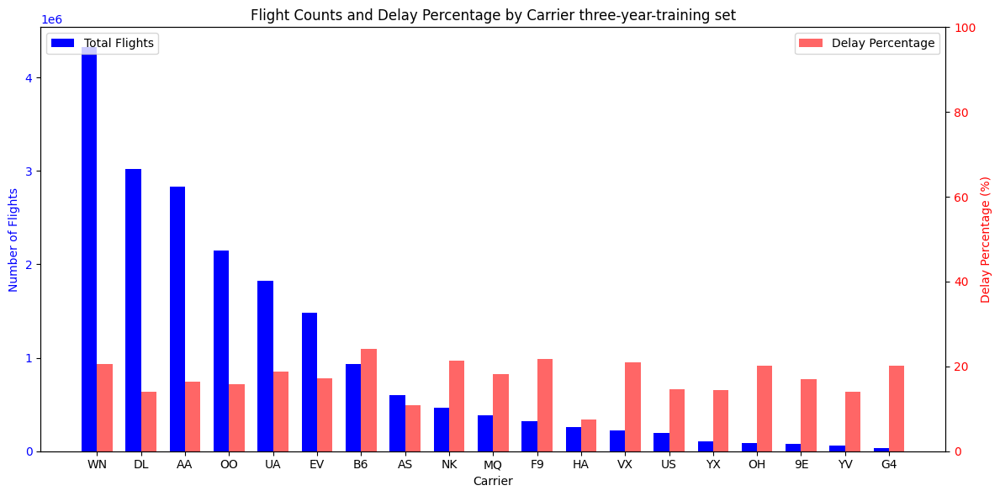

In [0]:
# count the occurrences of each unique carrier
carrier_count = df_otpw.groupBy('OP_UNIQUE_CARRIER').count()

# aggregate total flights and delayed flights for each carrier
carrier_delays = df_otpw.groupBy('OP_UNIQUE_CARRIER') \
  .agg(sql_count('*').alias('TotalFlights'), sql_sum(col('DEP_DEL15')).alias('DelayedFlights'))
    
# calculate delay percentage
carrier_delays = carrier_delays.withColumn('DelayPercentage', (col('DelayedFlights') / col('TotalFlights')) * 100)

# merge with the total flights data
carrier_combined = carrier_count.join(carrier_delays, ['OP_UNIQUE_CARRIER'])
carrier_combined_pd = carrier_combined.toPandas()
carrier_combined_pd = carrier_combined_pd.sort_values(by='TotalFlights', ascending=False)

# aggregate total flights and delayed flights for each carrier
carrier_delays = df_otpw.groupBy('OP_UNIQUE_CARRIER') \
  .agg(sql_count('*').alias('TotalFlights'), sql_sum(col('DEP_DEL15')).alias('DelayedFlights'))
    
# calculate delay percentage
carrier_delays = carrier_delays.withColumn('DelayPercentage', (col('DelayedFlights') / col('TotalFlights')) * 100)

# merge withtotal flights data
carrier_combined = carrier_count.join(carrier_delays, ['OP_UNIQUE_CARRIER'])
carrier_combined_pd = carrier_combined.toPandas()
carrier_combined_pd = carrier_combined_pd.sort_values(by='TotalFlights', ascending=False)

# number of carriers
n_carriers = len(carrier_combined_pd)

# X locations for the groups
ind = np.arange(n_carriers)

# width of the bars
width = 0.35

fig, ax1 = plt.subplots(figsize=(12, 6))

# plot
total_flights_bars = ax1.bar(ind - width/2, carrier_combined_pd['TotalFlights'], width, label='Total Flights', color='b')

# create a second y-axis for delay percentage
ax2 = ax1.twinx()
delay_percentage_bars = ax2.bar(ind + width/2, carrier_combined_pd['DelayPercentage'], width, label='Delay Percentage', color='r', alpha=0.6)

# labels
ax1.set_xlabel('Carrier')
ax1.set_ylabel('Number of Flights', color='b')
ax2.set_ylabel('Delay Percentage (%)', color='r')
ax1.set_xticks(ind)
ax1.set_xticklabels(carrier_combined_pd['OP_UNIQUE_CARRIER'])
ax1.tick_params(axis='y', labelcolor='b')
ax2.tick_params(axis='y', labelcolor='r')

# Set the limit for the delay percentage y-axis
ax2.set_ylim(0, 100)

# show
plt.title('Flight Counts and Delay Percentage by Carrier three-year-training set')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()




### explore the size of airport

In [0]:
# Aggregate total flights and delayed flights for each airport
airport_delays = df_otpw.groupBy('ORIGIN') \
    .agg(sql_count('*').alias('TotalFlights'), 
         sql_sum(col('DEP_DEL15')).alias('DelayedFlights'))

# Calculate delay percentage
airport_delays = airport_delays.withColumn('DelayPercentage', 
                                           (col('DelayedFlights') / col('TotalFlights')) * 100)

# Filter out airports with delay percentage > 60% and exclude ATL
filtered_airports = airport_delays.filter(
    (col('DelayPercentage') <= 60) & (col('ORIGIN') != 'ATL')
)

# Split into two DataFrames based on total flights
airports_under_10000 = filtered_airports.filter(col('TotalFlights') < 10000)
airports_over_10000 = filtered_airports.filter(col('TotalFlights') >= 10000)

# Convert to Pandas DataFrames for plotting
airports_under_10000_pd = airports_under_10000.toPandas()
airports_over_10000_pd = airports_over_10000.toPandas()


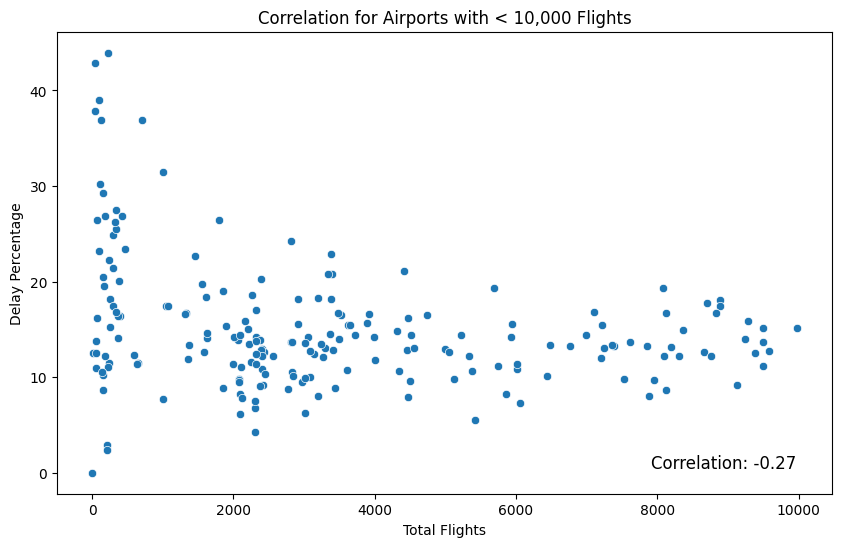

In [0]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TotalFlights', y='DelayPercentage', data=airports_under_10000_pd)

plt.title('Correlation for Airports with < 10,000 Flights')
plt.xlabel('Total Flights')
plt.ylabel('Delay Percentage')

# Calculate correlation for this subset
correlation_under_10000 = airports_under_10000.stat.corr('TotalFlights', 'DelayPercentage')

# Text placement
max_flights_under = airports_under_10000_pd['TotalFlights'].dropna().max()
min_delay_under = airports_under_10000_pd['DelayPercentage'].dropna().min()

plt.text(x=max_flights_under, y=min_delay_under, 
         s=f'Correlation: {correlation_under_10000:.2f}', 
         horizontalalignment='right', 
         verticalalignment='bottom', 
         fontsize=12)

plt.show()


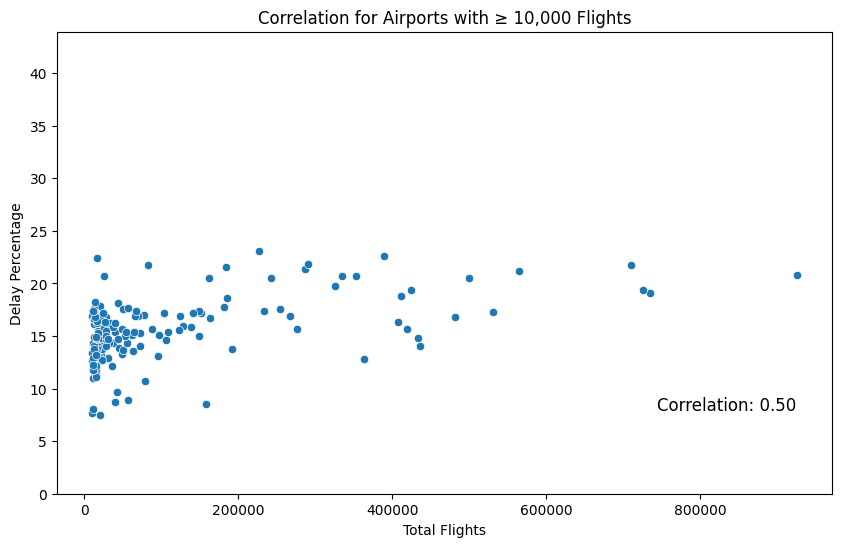

In [0]:
# Determine a common y-axis limit
common_y_max = airports_under_10000.agg(max("DelayPercentage")).first()[0]
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TotalFlights', y='DelayPercentage', data=airports_over_10000_pd)

plt.title('Correlation for Airports with ≥ 10,000 Flights')
plt.xlabel('Total Flights')
plt.ylabel('Delay Percentage')
plt.ylim(0, common_y_max)  # Set common y-axis limit

# Calculate correlation for this subset
correlation_over_10000 = airports_over_10000.stat.corr('TotalFlights', 'DelayPercentage')

# Text placement
max_flights_over = airports_over_10000_pd['TotalFlights'].dropna().max()
min_delay_over = airports_over_10000_pd['DelayPercentage'].dropna().min()

plt.text(x=max_flights_over, y=min_delay_over, 
         s=f'Correlation: {correlation_over_10000:.2f}', 
         horizontalalignment='right', 
         verticalalignment='bottom', 
         fontsize=12)

plt.show()


In [0]:
from pyspark.sql.functions import count as sql_count, col, when
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.sql.functions import count as sql_count, col, when

# Filter the DataFrame for the year 2015
df_2015 = df_otpw.filter(col('YEAR') == 2015)

# Aggregate total flights for each airport in 2015
total_flights_2015 = df_2015.groupBy('ORIGIN').agg(sql_count('*').alias('TotalFlights2015'))

# Add a new column for airport size category based on 2015 data
total_flights_2015 = total_flights_2015.withColumn(
    'AirportSize', 
    when(col('TotalFlights2015') < 2000, 'tiny')
    .when((col('TotalFlights2015') >= 2000) & (col('TotalFlights2015') < 5000), 'small')
    .when((col('TotalFlights2015') >= 5000) & (col('TotalFlights2015') < 25000), 'large')
    .otherwise('huge')
)
# Join the categorized data back to the original DataFrame
df_2015 = df_2015.join(total_flights_2015.select('ORIGIN', 'AirportSize'), on='ORIGIN', how='left')




In [0]:
from pyspark.sql.functions import col, count as sql_count, sum as sql_sum

# Aggregate total flights and delayed flights for each airport
airport_delays = df_2015.groupBy('ORIGIN') \
    .agg(sql_count('*').alias('TotalFlights'), 
         sql_sum(col('DEP_DEL15')).alias('DelayedFlights'))

# Calculate delay percentage
airport_delays = airport_delays.withColumn('DelayPercentage', 
                                           (col('DelayedFlights') / col('TotalFlights')) * 100)

# Filter out airports with delay percentage > 60% and exclude ATL
filtered_airports = airport_delays.filter(
    (col('DelayPercentage') <= 60) & (col('ORIGIN') != 'ATL')
)

# Split into four DataFrames based on total flights
airports_under_2000 = filtered_airports.filter(col('TotalFlights') < 2000)
airports_under_5000 = filtered_airports.filter((col('TotalFlights') >= 2000) & (col('TotalFlights') < 5000))
airports_under_25000 = filtered_airports.filter((col('TotalFlights') >= 5000) & (col('TotalFlights') < 25000))
airports_over_25000 = filtered_airports.filter(col('TotalFlights') > 25000)

# Convert to Pandas DataFrames for plotting
airports_under_2000_pd = airports_under_2000.toPandas()
airports_under_5000_pd = airports_under_5000.toPandas()
airports_under_25000_pd = airports_under_25000.toPandas()
airports_over_25000_pd = airports_over_25000.toPandas()
# Continue with other conversions as needed


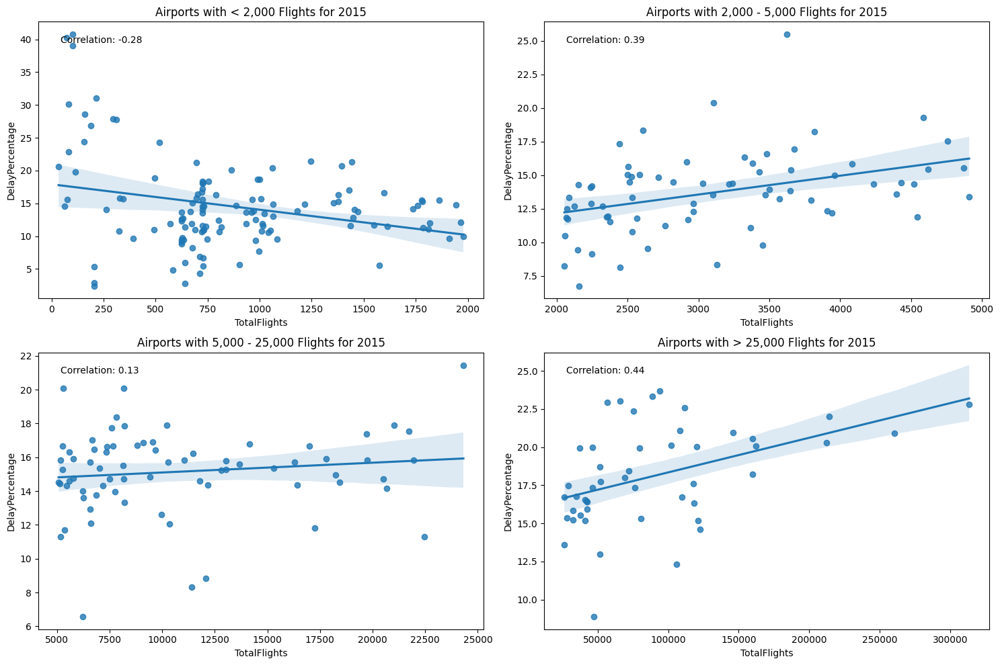

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import corr

# Function to calculate correlation and add it to the plot
def add_correlation_and_line(df, x_col, y_col, ax):
    correlation = df.stat.corr(x_col, y_col)
    sns.regplot(x=x_col, y=y_col, data=df.toPandas(), ax=ax)
    ax.text(0.05, 0.95, f'Correlation: {correlation:.2f}', transform=ax.transAxes, ha='left', va='top')

# Create a 2x2 grid of plots
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Plot for airports with < 2,000 flights
axs[0, 0].set_title('Airports with < 2,000 Flights for 2015')
add_correlation_and_line(airports_under_2000, 'TotalFlights', 'DelayPercentage', axs[0, 0])

# Plot for airports with 2,000 - 5,000 flights
axs[0, 1].set_title('Airports with 2,000 - 5,000 Flights for 2015')
add_correlation_and_line(airports_under_5000, 'TotalFlights', 'DelayPercentage', axs[0, 1])

# Plot for airports with 5,000 - 25,000 flights
axs[1, 0].set_title('Airports with 5,000 - 25,000 Flights for 2015')
add_correlation_and_line(airports_under_25000, 'TotalFlights', 'DelayPercentage', axs[1, 0])

# Plot for airports with > 25,000 flights
axs[1, 1].set_title('Airports with > 25,000 Flights for 2015')
add_correlation_and_line(airports_over_25000, 'TotalFlights', 'DelayPercentage', axs[1, 1])

# Adjust layout
plt.tight_layout()
plt.show()


In [0]:
# Join the categorized data back to the original DataFrame
df_otpw = df_otpw.join(total_flights_2015.select('ORIGIN', 'AirportSize'), on='ORIGIN', how='left')


### explore feature interactions

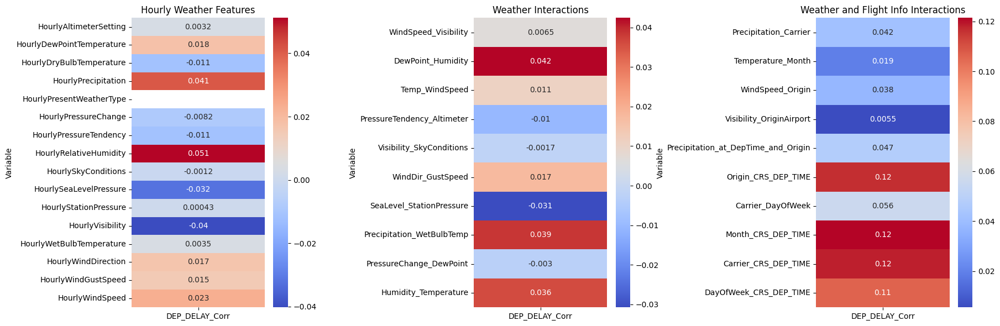

In [0]:
#Pearson Correlation - though normality assumption is not strictly met this may still provide some insight
#though it may overestimate or underestimate so take with grain of salt

from pyspark.sql.functions import corr, col

df_new = df_new.sample(False,.3)
hourly_weather_columns = ['HourlyAltimeterSetting', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature','HourlyPrecipitation', 'HourlyPresentWeatherType', 'HourlyPressureChange', 'HourlyPressureTendency', \
'HourlyRelativeHumidity', 'HourlySkyConditions', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility',\
  'HourlyWetBulbTemperature', 'HourlyWindDirection', 'HourlyWindGustSpeed', 'HourlyWindSpeed']

correlations = {'Variable': [], 'DEP_DELAY_Corr': []}
for column in hourly_weather_columns:
    df_temp = df_new.withColumn(column, col(column).cast("float"))
    
    # calculate correlation with DEP_DEL15
    dep_corr = df_temp.select(corr("DEP_DELAY", column)).collect()[0][0]
    correlations['Variable'].append(column)
    correlations['DEP_DELAY_Corr'].append(dep_corr)


correlations_weather_interactions = {'Variable': [], 'DEP_DELAY_Corr':[]}

for column in weather_interactions:
    df_temp = df_new.withColumn(column, col(column).cast("float"))
    
    # calculate correlation with DEP_DEL15
    dep_corr = df_temp.select(corr("DEP_DELAY", column)).collect()[0][0]
    correlations_weather_interactions['Variable'].append(column)
    correlations_weather_interactions['DEP_DELAY_Corr'].append(dep_corr)


correlations_feature_interactions = {'Variable': [], 'DEP_DELAY_Corr': []}
for column in feature_interact_columns:
    df_temp = df_new.withColumn(column, col(column).cast("float"))
    
    # calculate correlation with DEP_DEL15
    dep_corr = df_temp.select(corr("DEP_DELAY", column)).collect()[0][0]
    correlations_feature_interactions['Variable'].append(column)
    correlations_feature_interactions['DEP_DELAY_Corr'].append(dep_corr)


# convert for graph
pd_corr = pd.DataFrame(correlations)
pd_corr.set_index('Variable', inplace=True)

pd_corr_weather_interactions = pd.DataFrame(correlations_weather_interactions)
pd_corr_weather_interactions.set_index('Variable', inplace=True)

pd_corr_feature_interactions = pd.DataFrame(correlations_feature_interactions)
pd_corr_feature_interactions.set_index('Variable', inplace=True)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

sns.heatmap(pd_corr, annot=True, cmap='coolwarm', ax=axes[0])
axes[0].set_title('Hourly Weather Features')

sns.heatmap(pd_corr_weather_interactions, annot=True, cmap='coolwarm', ax=axes[1])
axes[1].set_title('Weather Interactions')

sns.heatmap(pd_corr_feature_interactions, annot=True, cmap='coolwarm', ax=axes[2])
axes[2].set_title('Weather and Flight Info Interactions')

plt.tight_layout()



In [0]:
from pyspark.ml.feature import Bucketizer

# Define buckets
bucket_edges = [15, 20, 25, 30,35 , 40, 45, 50, 55,60,65,70,75] 

bucketizer = Bucketizer(splits=bucket_edges, inputCol="LATITUDE", outputCol="LatitudeBucket")
df_buck = bucketizer.transform(df_new)


In [0]:
display(df_buck.limit(10))

QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,YEAR,OP_CARRIER,TAIL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST,origin_type,DEST_CITY_NAME,DEST_STATE_NM,STATION,CRS_ARR_TIME,CRS_DEP_TIME,DEP_DEL15,ARR_DEL15,DEP_DELAY,LATITUDE,ELEVATION,LONGITUDE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,QUARTER_mean,MONTH_mean,DAY_OF_MONTH_mean,DAY_OF_WEEK_mean,YEAR_mean,OP_CARRIER_mean,TAIL_NUM_mean,ORIGIN_mean,ORIGIN_CITY_NAME_mean,ORIGIN_STATE_NM_mean,ORIGIN_WAC_mean,DEST_AIRPORT_ID_mean,DEST_mean,origin_type_mean,DEST_CITY_NAME_mean,DEST_STATE_NM_mean,STATION_mean,DayOfWeek_CRS_DEP_TIME,Carrier_CRS_DEP_TIME,Month_CRS_DEP_TIME,Carrier_DayOfWeek,Origin_CRS_DEP_TIME,Precipitation_at_DepTime_and_Origin,Visibility_OriginAirport,WindSpeed_Origin,Temperature_Month,Precipitation_Carrier,WindSpeed_Visibility,DewPoint_Humidity,Temp_WindSpeed,PressureTendency_Altimeter,Visibility_SkyConditions,WindDir_GustSpeed,SeaLevel_StationPressure,Precipitation_WetBulbTemp,PressureChange_DewPoint,Humidity_Temperature,LatitudeBucket
1,1,10,6,2015,AA,N786AA,LAX,"Los Angeles, CA",California,91,12478,JFK,large_airport,"New York, NY",New York,72295023174,1729.0,900.0,0.0,0.0,-2.0,33.938,29.6,-118.3888,29.97,52.0,58.0,0.01,0.0,0.0,0.0,81.0,0.0,29.97,29.62,3.0,55.0,50.0,0.0,7.0,0.20404,0.19838011,0.14221792,0.18278188,0.20404,0.20090757,0.20958084,0.19903,0.19903,0.18416128,0.18416128,0.25566718,0.25566718,0.20711432,0.27819672,0.2727961,0.19903,164.5037,180.81682,178.5421,0.03672226,179.127,1.79127,0.59709,1.3932099,11.506046,0.0020090756,21.0,4212.0,406.0,0.0,0.0,0.0,887.7114,0.55,0.0,4698.0,3.0
1,3,24,2,2015,AA,N789AA,JFK,"New York, NY",New York,22,12892,LAX,large_airport,"Los Angeles, CA",California,74486094789,1600.0,1230.0,0.0,0.0,-8.0,40.63915,3.4,-73.76401,30.33,11.0,39.0,0.0,0.0,0.04,6.0,31.0,0.0,30.33,30.3,10.0,30.0,230.0,0.0,10.0,0.20404,0.19354708,0.17323668,0.18905187,0.20404,0.20090757,0.14444445,0.27085704,0.2825916,0.26646987,0.26646987,0.2118543,0.2118543,0.20711432,0.2118543,0.21215393,0.27085704,232.5338,247.11632,238.06291,0.037981953,333.15414,0.0,2.7085705,2.7085705,7.5483365,0.0,100.0,341.0,390.0,181.98,0.0,0.0,918.99896,0.0,0.44,1209.0,5.0
1,1,23,5,2015,AA,N381AA,DFW,"Dallas/Fort Worth, TX",Texas,74,12173,HNL,large_airport,"Honolulu, HI",Hawaii,72259003927,1758.0,1315.0,0.0,0.0,0.0,32.8978,170.7,-97.0189,30.16,26.0,50.0,0.0,0.0,0.0,0.0,39.0,0.0,30.16,29.52,10.0,40.0,340.0,0.0,22.0,0.20404,0.19838011,0.2110362,0.21213892,0.20404,0.20090757,0.17777778,0.24122174,0.24122174,0.21300013,0.21300013,0.13252796,0.13252796,0.20711432,0.13252796,0.11691459,0.24122174,278.96268,264.19345,260.86984,0.042620316,317.2066,0.0,2.4122174,5.306878,9.919005,0.0,220.0,1014.0,1100.0,0.0,0.0,0.0,890.3232,0.0,0.0,1950.0,3.0
1,1,8,4,2015,AA,N386AA,HNL,"Honolulu, HI",Hawaii,2,11298,DFW,large_airport,"Dallas/Fort Worth, TX",Texas,91182022521,506.0,1745.0,0.0,0.0,-2.0,21.324,2.1,-157.9294,30.01,61.0,71.0,0.0,0.0,0.0,0.0,71.0,0.0,30.01,29.99,10.0,65.0,330.0,0.0,5.0,0.20404,0.19838011,0.19893065,0.20786937,0.20404,0.20090757,0.2987013,0.10566575,0.10566575,0.115378186,0.115378186,0.19765078,0.19765078,0.20711432,0.19765078,0.19635874,0.10566575,362.73206,350.5837,346.1733,0.04176253,184.38673,0.0,1.0566576,0.5283288,14.084988,0.0,50.0,4331.0,355.0,0.0,0.0,0.0,899.9999,0.0,0.0,5041.0,1.0
1,2,15,7,2015,AA,N376AA,HNL,"Honolulu, HI",Hawaii,2,11298,DFW,large_airport,"Dallas/Fort Worth, TX",Texas,91182022521,506.0,1745.0,0.0,1.0,6.0,21.324,2.1,-157.9294,29.98,58.0,66.0,0.0,0.0,0.0,0.0,75.0,0.0,29.98,29.96,10.0,61.0,350.0,0.0,6.0,0.20404,0.22303197,0.18126573,0.22476926,0.20404,0.20090757,0.2535211,0.10566575,0.10566575,0.115378186,0.115378186,0.19765078,0


### feature distributions

In [0]:
#### create sampled df for graphing distributions ###

def index_categorical(columns,f_col, df_temp):
    new_column_names = []
    for column in columns:
        try:
            print(f'Processing column: {column}')
            temp_indexer = StringIndexer(inputCol=column, outputCol=column + '_index', handleInvalid='keep').fit(df_temp)
            df_temp = temp_indexer.transform(df_temp)
            new_column_names.append(column + '_index')
        except AnalysisException as e:
            print(f'Could not convert {column}: {e.desc}')

    for col_name in f_col:
        df_temp = df_temp.withColumn(col_name, col(col_name).cast('float'))
        new_column_names.append(col_name)

    print(new_column_names)
    return df_temp.select(*new_column_names)
  
df_new = index_categorical(cat_cols,float_cols, df_otpw.sample(.3))

Processing column: QUARTER
Processing column: MONTH
Processing column: DAY_OF_MONTH
Processing column: DAY_OF_WEEK
Processing column: YEAR
Processing column: OP_CARRIER
Processing column: TAIL_NUM
Processing column: ORIGIN
Processing column: ORIGIN_CITY_NAME
Processing column: ORIGIN_STATE_NM
Processing column: ORIGIN_WAC
Processing column: DEST_AIRPORT_ID
Processing column: DEST
Processing column: origin_type
Processing column: DEST_CITY_NAME
Processing column: DEST_STATE_NM
Processing column: STATION
['QUARTER_index', 'MONTH_index', 'DAY_OF_MONTH_index', 'DAY_OF_WEEK_index', 'YEAR_index', 'OP_CARRIER_index', 'TAIL_NUM_index', 'ORIGIN_index', 'ORIGIN_CITY_NAME_index', 'ORIGIN_STATE_NM_index', 'ORIGIN_WAC_index', 'DEST_AIRPORT_ID_index', 'DEST_index', 'origin_type_index', 'DEST_CITY_NAME_index', 'DEST_STATE_NM_index', 'STATION_index', 'CRS_ARR_TIME', 'CRS_DEP_TIME', 'DEP_DEL15', 'ARR_DEL15', 'DEP_DELAY', 'LATITUDE', 'ELEVATION', 'LONGITUDE', 'HourlyAltimeterSetting', 'HourlyDewPointTem

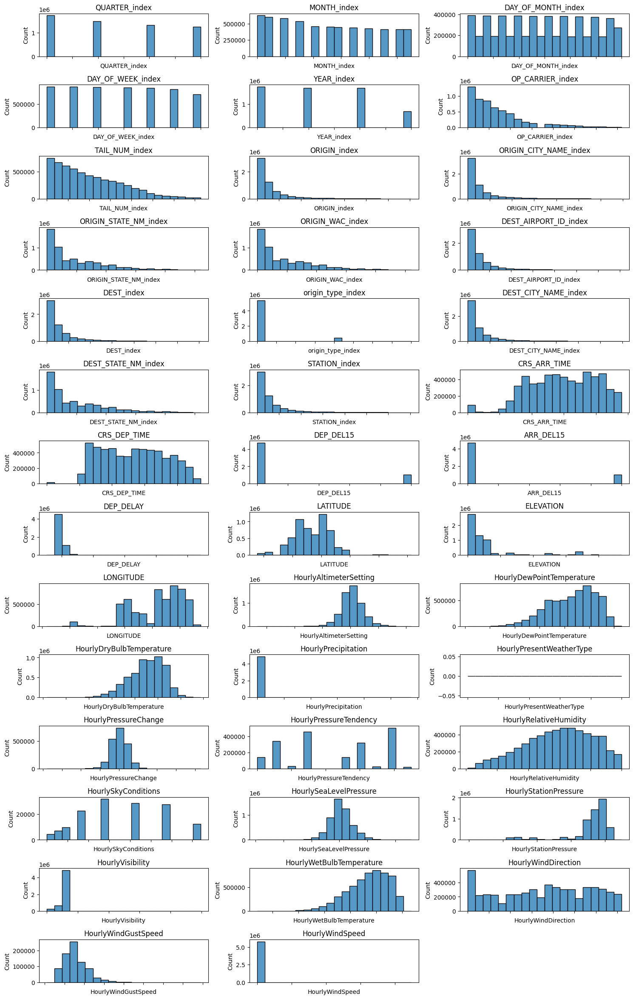

In [0]:
# Get Distributions


fraction = 1 
sampled_df = df_new

# set up subplots
num_cols = len(df_new.columns)
nrows = int(num_cols / 3) + (num_cols % 5 > 0) +1
ncols = 3

# convert for graphing
pandas_df = sampled_df.toPandas()

fig, axs = plt.subplots(nrows, ncols, figsize=(15, 25))  # Adjust figsize as needed

# flatten array of axes
axs = axs.flatten()

# loop through and plot
for i, column in enumerate(df_new.columns):
    sns.histplot(pandas_df[column], bins=20, ax=axs[i])  # Adjust bins as needed
    axs[i].set_title(column)
    axs[i].set_xticklabels([])

# hide unused subplots
for i in range(num_cols, len(axs)):
    axs[i].set_visible(False)

plt.tight_layout()
plt.show()


#Lasso and Forest Feature Importance


### Lasso Feature Selection


#### Lasso Feature Selection with interactions

RMSE: 65.69788615245088


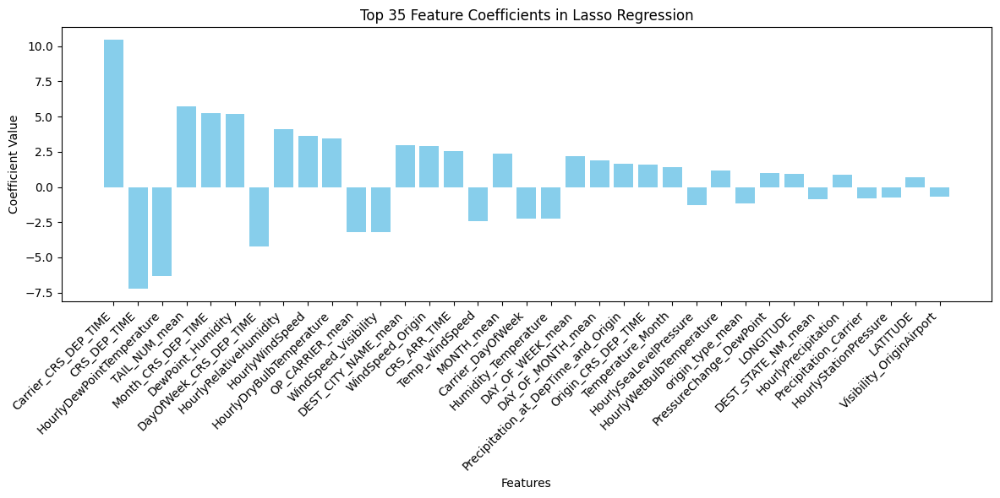

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.sql.functions import col
import matplotlib.pyplot as plt

float_cols_no_y2=[]
for column in float_cols:
  if column not in ['DEP_DELAY','DEP_DEL15','ARR_DEL15','TAIL_NUM_mean','ARR_DELAY','DATE']:
    float_cols_no_y2.append(column)
# inputs
assemblerInputs = cat_cols_mean + float_cols_no_y2 + feature_interact_columns + weather_interactions


# spark = SparkSession.builder.appName("LassoFeatureSelection").getOrCreate()
columns = cat_cols + float_cols
df_new = df_otpw.select(*columns).sample(False,.4)
df_new = df_new.withColumn("DEP_DEL15", col("DEP_DEL15").cast("float"))
df_new = df_new.withColumn("DEP_DELAY", col("DEP_DELAY").cast("float"))

def downsample_majority_class(df, label_col, majority_label, minority_label):
    # Count the number of instances in each class
    major_df = df.filter(col(label_col) == majority_label)
    minor_df = df.filter(col(label_col) == minority_label)
    ratio = int(major_df.count() / minor_df.count())
    sampled_majority_df = major_df.sample(False, 1/ratio)
    return sampled_majority_df.unionAll(minor_df)

# Downsample the dataset before splitting into train and validation sets
df_balanced = downsample_majority_class(df_new, "DEP_DEL15", 0, 1)

# Cast MONTH column to float
df_balanced = df_balanced.withColumn("YEAR", col("YEAR").cast("float"))

# Split the data into training and validation sets
train_df = df_balanced.filter((col("YEAR") >= 2015) & (col("YEAR") < 2017))
val_df = df_balanced.filter((col("YEAR") >= 2017))

# get mean encoding for categorical from training and then apply to validation
train_df, val_df, mapper = mean_encoding(train_df, val_df, cat_cols)

# cast columns
train_df = cast_columns(train_df, float_cols, cat_cols,cat_cols_mean, float_cols_no_y2)
val_df = cast_columns(val_df, float_cols, cat_cols,cat_cols_mean, float_cols_no_y2)

# Interactions
train_df,x = create_interactions(train_df)
val_df,x = create_interactions(val_df)

# select columns of interest
columns_of_interest = cat_cols_mean + float_cols + feature_interact_columns + weather_interactions
train_df = train_df.select(*columns_of_interest)
val_df = val_df.select(*columns_of_interest)

# Define the pipeline stages
assembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=True)
lasso = LinearRegression(featuresCol='scaledFeatures', labelCol='DEP_DELAY', elasticNetParam=1, regParam=0.001)
pipeline = Pipeline(stages=[assembler, scaler, lasso])

# Fit the model on the training set
lasso_model_fitted = pipeline.fit(train_df)

# Apply the model to the validation set
predictions = lasso_model_fitted.transform(val_df)

from pyspark.ml.evaluation import RegressionEvaluator

# Evaluate the model using RMSE
evaluator_rmse = RegressionEvaluator(labelCol="DEP_DELAY", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)
print(f"RMSE: {rmse}")

# Extract coefficients for feature importance
lasso_model = lasso_model_fitted.stages[-1]
if lasso_model is not None:
    coefficients = lasso_model.coefficients.toArray()
    feature_coefficients = list(zip(assemblerInputs, coefficients))  # Ensure this matches the features used
    sorted_features = sorted(feature_coefficients, key=lambda x: abs(x[1]), reverse=True)
    top_35_features = sorted_features[:35]
    top_feature_names, top_coefficients = zip(*top_35_features)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(top_feature_names, top_coefficients, color='skyblue')
    plt.xlabel('Features')
    plt.ylabel('Coefficient Value')
    plt.xticks(rotation=45, ha='right')
    plt.title('Top 35 Feature Coefficients in Lasso Regression')
    plt.tight_layout()
    plt.show()


RMSE: 157.96803373552615


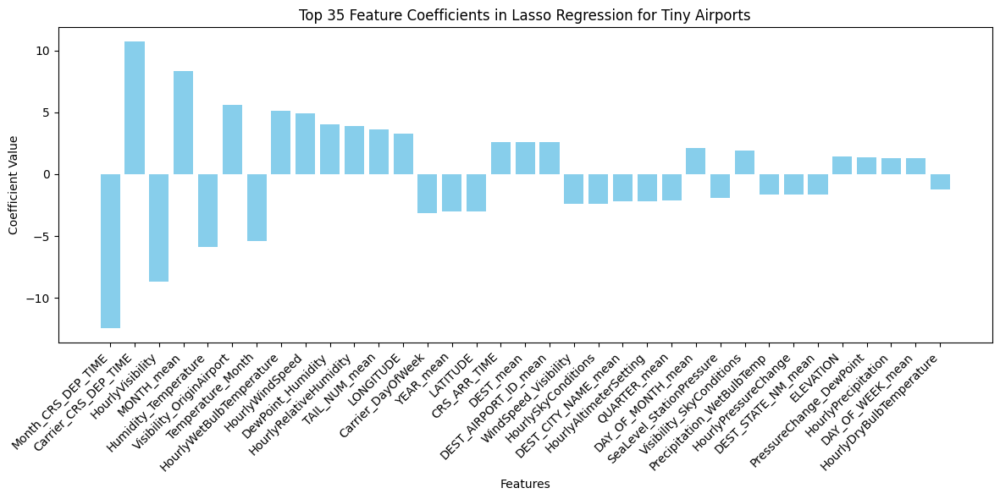

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.sql.functions import col
import matplotlib.pyplot as plt

float_cols_no_y2=[]
for column in float_cols:
  if column not in ['DEP_DELAY','DEP_DEL15','ARR_DEL15','TAIL_NUM_mean','ARR_DELAY','DATE']:
    float_cols_no_y2.append(column)
# inputs
assemblerInputs = cat_cols_mean + float_cols_no_y2 + feature_interact_columns + weather_interactions


# spark = SparkSession.builder.appName("LassoFeatureSelection").getOrCreate()
columns = cat_cols + float_cols
df_new = df_otpw.filter((col('AirportSize')=='tiny')).select(*columns).sample(False,.4)
df_new = df_new.withColumn("DEP_DEL15", col("DEP_DEL15").cast("float"))
df_new = df_new.withColumn("DEP_DELAY", col("DEP_DELAY").cast("float"))

def downsample_majority_class(df, label_col, majority_label, minority_label):
    # Count the number of instances in each class
    major_df = df.filter(col(label_col) == majority_label)
    minor_df = df.filter(col(label_col) == minority_label)
    ratio = int(major_df.count() / minor_df.count())
    sampled_majority_df = major_df.sample(False, 1/ratio)
    return sampled_majority_df.unionAll(minor_df)

# Downsample the dataset before splitting into train and validation sets
df_balanced = downsample_majority_class(df_new, "DEP_DEL15", 0, 1)

# Cast MONTH column to float
df_balanced = df_balanced.withColumn("YEAR", col("YEAR").cast("float"))

# Split the data into training and validation sets
train_df = df_balanced.filter((col("YEAR") >= 2015) & (col("YEAR") < 2017))
val_df = df_balanced.filter((col("YEAR") >= 2017))

# get mean encoding for categorical from training and then apply to validation
train_df, val_df, mapper = mean_encoding(train_df, val_df, cat_cols)

# cast columns
train_df = cast_columns(train_df, float_cols, cat_cols,cat_cols_mean, float_cols_no_y2)
val_df = cast_columns(val_df, float_cols, cat_cols,cat_cols_mean, float_cols_no_y2)

# Interactions
train_df,x = create_interactions(train_df)
val_df,x = create_interactions(val_df)

# select columns of interest
columns_of_interest = cat_cols_mean + float_cols + feature_interact_columns + weather_interactions
train_df = train_df.select(*columns_of_interest)
val_df = val_df.select(*columns_of_interest)

# Define the pipeline stages
assembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=True)
lasso = LinearRegression(featuresCol='scaledFeatures', labelCol='DEP_DELAY', elasticNetParam=1, regParam=0.001)
pipeline = Pipeline(stages=[assembler, scaler, lasso])

# Fit the model on the training set
lasso_model_fitted = pipeline.fit(train_df)

# Apply the model to the validation set
predictions = lasso_model_fitted.transform(val_df)

from pyspark.ml.evaluation import RegressionEvaluator

# Evaluate the model using RMSE
evaluator_rmse = RegressionEvaluator(labelCol="DEP_DELAY", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)
print(f"RMSE: {rmse}")

# Extract coefficients for feature importance
lasso_model = lasso_model_fitted.stages[-1]
if lasso_model is not None:
    coefficients = lasso_model.coefficients.toArray()
    feature_coefficients = list(zip(assemblerInputs, coefficients))  # Ensure this matches the features used
    sorted_features = sorted(feature_coefficients, key=lambda x: abs(x[1]), reverse=True)
    top_35_features = sorted_features[:35]
    top_feature_names, top_coefficients = zip(*top_35_features)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(top_feature_names, top_coefficients, color='skyblue')
    plt.xlabel('Features')
    plt.ylabel('Coefficient Value')
    plt.xticks(rotation=45, ha='right')
    plt.title('Top 35 Feature Coefficients in Lasso Regression for Tiny Airports')
    plt.tight_layout()
    plt.show()


RMSE: 61.22071349884111


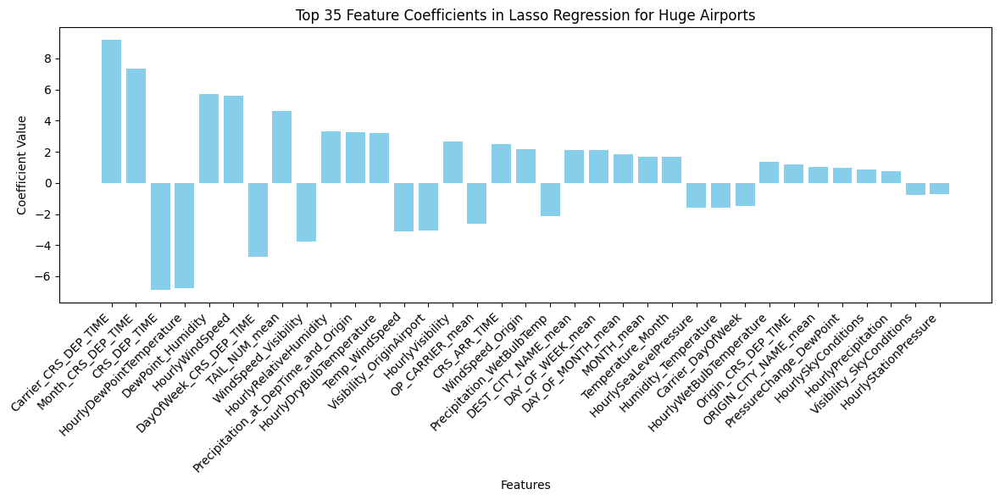

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.sql.functions import col
import matplotlib.pyplot as plt

float_cols_no_y2=[]
for column in float_cols:
  if column not in ['DEP_DELAY','DEP_DEL15','ARR_DEL15','TAIL_NUM_mean','ARR_DELAY','DATE']:
    float_cols_no_y2.append(column)
# inputs
assemblerInputs = cat_cols_mean + float_cols_no_y2 + feature_interact_columns + weather_interactions


# spark = SparkSession.builder.appName("LassoFeatureSelection").getOrCreate()
columns = cat_cols + float_cols
df_new = df_otpw.filter((col('AirportSize')=='huge')).select(*columns).sample(False,.4)
df_new = df_new.withColumn("DEP_DEL15", col("DEP_DEL15").cast("float"))
df_new = df_new.withColumn("DEP_DELAY", col("DEP_DELAY").cast("float"))

def downsample_majority_class(df, label_col, majority_label, minority_label):
    # Count the number of instances in each class
    major_df = df.filter(col(label_col) == majority_label)
    minor_df = df.filter(col(label_col) == minority_label)
    ratio = int(major_df.count() / minor_df.count())
    sampled_majority_df = major_df.sample(False, 1/ratio)
    return sampled_majority_df.unionAll(minor_df)

# Downsample the dataset before splitting into train and validation sets
df_balanced = downsample_majority_class(df_new, "DEP_DEL15", 0, 1)

# Cast MONTH column to float
df_balanced = df_balanced.withColumn("YEAR", col("YEAR").cast("float"))

# Split the data into training and validation sets
train_df = df_balanced.filter((col("YEAR") >= 2015) & (col("YEAR") < 2017))
val_df = df_balanced.filter((col("YEAR") >= 2017))

# get mean encoding for categorical from training and then apply to validation
train_df, val_df, mapper = mean_encoding(train_df, val_df, cat_cols)

# cast columns
train_df = cast_columns(train_df, float_cols, cat_cols,cat_cols_mean, float_cols_no_y2)
val_df = cast_columns(val_df, float_cols, cat_cols,cat_cols_mean, float_cols_no_y2)

# Interactions
train_df,x = create_interactions(train_df)
val_df,x = create_interactions(val_df)

# select columns of interest
columns_of_interest = cat_cols_mean + float_cols + feature_interact_columns + weather_interactions
train_df = train_df.select(*columns_of_interest)
val_df = val_df.select(*columns_of_interest)

# Define the pipeline stages
assembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=True)
lasso = LinearRegression(featuresCol='scaledFeatures', labelCol='DEP_DELAY', elasticNetParam=1, regParam=0.001)
pipeline = Pipeline(stages=[assembler, scaler, lasso])

# Fit the model on the training set
lasso_model_fitted = pipeline.fit(train_df)

# Apply the model to the validation set
predictions = lasso_model_fitted.transform(val_df)

from pyspark.ml.evaluation import RegressionEvaluator

# Evaluate the model using RMSE
evaluator_rmse = RegressionEvaluator(labelCol="DEP_DELAY", predictionCol="prediction", metricName="rmse")
rmse = evaluator_rmse.evaluate(predictions)
print(f"RMSE: {rmse}")

# Extract coefficients for feature importance
lasso_model = lasso_model_fitted.stages[-1]
if lasso_model is not None:
    coefficients = lasso_model.coefficients.toArray()
    feature_coefficients = list(zip(assemblerInputs, coefficients))  # Ensure this matches the features used
    sorted_features = sorted(feature_coefficients, key=lambda x: abs(x[1]), reverse=True)
    top_35_features = sorted_features[:35]
    top_feature_names, top_coefficients = zip(*top_35_features)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(top_feature_names, top_coefficients, color='skyblue')
    plt.xlabel('Features')
    plt.ylabel('Coefficient Value')
    plt.xticks(rotation=45, ha='right')
    plt.title('Top 35 Feature Coefficients in Lasso Regression for Huge Airports')
    plt.tight_layout()
    plt.show()



### categorize airports by size

In [0]:
from pyspark.sql.functions import collect_set

# Group by AirportSizeVec and collect unique ORIGIN codes
airport_size_groups = df_otpw.groupBy('AirportSize').agg(collect_set('ORIGIN').alias('UniqueOrigins'))

# Collect the results
airport_size_results = airport_size_groups.collect()

# Print unique ORIGIN codes for each AirportSizeVec category
for row in airport_size_results:
    print(f"Airport Size Category: {row['AirportSize']}")
    print(f"Unique ORIGIN Codes: {row['UniqueOrigins']}\n")

Airport Size Category: None
Unique ORIGIN Codes: ['CGI', 'YNG', 'AZA', 'HTS', 'STS', 'LYH', 'EFD', 'OWB', 'OGD', 'ENV', 'FLO', 'SWO', 'BLV', 'PSM', 'IFP', 'PGV', 'BFF', 'TKI', 'SLN', 'SCK', 'PVU', 'PGD', 'HVN', 'UIN', 'PIE', 'HGR', 'LBF', 'LBL', 'OGS', 'SFB', 'SHD', 'RFD', 'PSE', 'LWB', 'CKB', 'USA', 'LCK']

Airport Size Category: tiny
Unique ORIGIN Codes: ['HOB', 'ROW', 'LWS', 'DLG', 'STC', 'MQT', 'CDV', 'IAG', 'BLI', 'RKS', 'ORH', 'LBE', 'SUN', 'SWF', 'ADQ', 'PUB', 'CNY', 'MTJ', 'ABY', 'WRG', 'MVY', 'SAF', 'PSG', 'PLN', 'LSE', 'WYS', 'DHN', 'GRI', 'CSG', 'GGG', 'AVP', 'RDD', 'PAH', 'VEL', 'JMS', 'DLH', 'OME', 'ILG', 'BQK', 'JLN', 'BTM', 'SMX', 'HDN', 'FAY', 'BRD', 'CWA', 'YAK', 'GCK', 'MMH', 'SUX', 'LAW', 'BPT', 'PPG', 'TOL', 'ACT', 'DAB', 'MHK', 'OTZ', 'SPS', 'BGM', 'HYS', 'SGU', 'ESC', 'UST', 'GUC', 'RHI', 'EGE', 'AKN', 'GCC', 'COD', 'CEC', 'BGR', 'ERI', 'BJI', 'SCC', 'PIB', 'TWF', 'GFK', 'DIK', 'AZO', 'EWN', 'MKG', 'ACK', 'PBG', 'PIH', 'MLB', 'CLD', 'ACV', 'FLG', 'DVL', 'HIB', 'LA

In [0]:
tiny_airports = ['HOB', 'ROW', 'LWS', 'DLG', 'STC', 'MQT', 'CDV', 'IAG', 'BLI', 'RKS', 'ORH', 'LBE', 'SUN', 'SWF', 'ADQ', 'PUB', 'CNY', 'MTJ', 'ABY', 'WRG', 'MVY', 'SAF', 'PSG', 'PLN', 'LSE', 'WYS', 'DHN', 'GRI', 'CSG', 'GGG', 'AVP', 'RDD', 'PAH', 'VEL', 'JMS', 'DLH', 'OME', 'ILG', 'BQK', 'JLN', 'BTM', 'SMX', 'HDN', 'FAY', 'BRD', 'CWA', 'YAK', 'GCK', 'MMH', 'SUX', 'LAW', 'BPT', 'PPG', 'TOL', 'ACT', 'DAB', 'MHK', 'OTZ', 'SPS', 'BGM', 'HYS', 'SGU', 'ESC', 'UST', 'GUC', 'RHI', 'EGE', 'AKN', 'GCC', 'COD', 'CEC', 'BGR', 'ERI', 'BJI', 'SCC', 'PIB', 'TWF', 'GFK', 'DIK', 'AZO', 'EWN', 'MKG', 'ACK', 'PBG', 'PIH', 'MLB', 'CLD', 'ACV', 'FLG', 'DVL', 'HIB', 'LAR', 'GTR', 'OAJ', 'CDC', 'IMT', 'MBS', 'SIT', 'COU', 'GST', 'ALO', 'CIU', 'DBQ', 'ITH', 'HYA', 'APN', 'TXK', 'HLN', 'VLD', 'BET', 'EAU', 'CMX', 'SCE', 'EKO', 'PHF', 'ABR', 'ADK', 'INL', 'CPR', 'MEI', 'SJT', 'STX', 'OTH', 'SPI', 'BQN', 'BRW']  # Add all codes for 'tiny'

small_airports = ['ISP', 'ECP', 'GNV', 'TYR', 'RAP', 'FSM', 'LNK', 'KTN', 'LAN', 'BTV', 'GTF', 'TRI', 'EYW', 'EVV', 'MGM', 'GJT', 'GRK', 'LCH', 'CRW', 'AGS', 'FAI', 'CHO', 'MLI', 'HSV', 'RST', 'CHA', 'YUM', 'ROA', 'MSO', 'SRQ', 'MFE', 'BIL', 'TLH', 'BRO', 'BIS', 'ASE', 'BMI', 'MOT', 'PSC', 'ATW', 'SBP', 'IDA', 'AVL', 'ISN', 'MFR', 'GPT', 'BFL', 'JAC', 'MRY', 'AMA', 'STT', 'ILM', 'DRO', 'CMI', 'ABE', 'TTN', 'ACY', 'MDT', 'AEX', 'LRD', 'HRL', 'SBN', 'RDM', 'BZN', 'FCA', 'ABI', 'EUG', 'JNU', 'ELM', 'TVC', 'CLL', 'MLU']  # Add all codes for 'small'

large_airports = ['ANC', 'FAT', 'GEG', 'BDL', 'ONT', 'HPN', 'JAN', 'LEX', 'BTR', 'GSO', 'BUR', 'PWM', 'OGG', 'TUL', 'ELP', 'OKC', 'RNO', 'DAY', 'DSM', 'LIT', 'ABQ', 'CAK', 'FSD', 'BHM', 'PBI', 'MEM', 'FNT', 'SYR', 'LGB', 'MOB', 'PVD', 'CVG', 'BOI', 'PNS', 'KOA', 'ORF', 'SHV', 'PSP', 'CID', 'MHT', 'MAF', 'GRR', 'JAX', 'CRP', 'BUF', 'ALB', 'VPS', 'FWA', 'GRB', 'XNA', 'ICT', 'LFT', 'SAV', 'SBA', 'CHS', 'CAE', 'SDF', 'COS', 'SGF', 'MSN', 'RIC', 'TUS', 'LIH', 'LBB', 'TYS', 'MYR', 'FAR', 'ITO', 'GSP', 'SJU', 'OMA', 'ROC', 'PIA']

unsure=['CGI', 'YNG', 'AZA', 'HTS', 'STS', 'LYH', 'EFD', 'OWB', 'OGD', 'ENV', 'FLO', 'SWO', 'BLV', 'PSM', 'IFP', 'PGV', 'BFF', 'TKI', 'SLN', 'SCK', 'PVU', 'PGD', 'HVN', 'UIN', 'PIE', 'HGR', 'LBF', 'LBL', 'OGS', 'SFB', 'SHD', 'RFD', 'PSE', 'LWB', 'CKB', 'USA', 'LCK']


# Add a new column 'AirportSize' based on the ORIGIN code
df_otpw = df_otpw.withColumn('AirportSize',
                             when(col('ORIGIN').isin(tiny_airports), 'tiny')
                             .when(col('ORIGIN').isin(small_airports), 'small')
                             .when(col('ORIGIN').isin(large_airports), 'large')
                             .when(col('ORIGIN').isin(unsure), 'unsure')
                             .otherwise('huge'))


ORIGIN,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,YEAR,MONTH,origin_airport_name,origin_station_name,origin_station_id,origin_iata_code,origin_icao,origin_type,origin_region,origin_station_lat,origin_station_lon,origin_airport_lat,origin_airport_lon,origin_station_dis,dest_airport_name,dest_station_name,dest_station_id,dest_iata_code,dest_icao,dest_type,dest_region,dest_station_lat,dest_station_lon,dest_airport_lat,dest_airport_lon,dest_station_dis,sched_depart_date_time_UTC,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurati